#**Shaping Positive Perceptions: Sentiment Analysis of Russo-Ukrainian War**<br>




## Sentiment Modelling

In [ ]:
!pip install vaderSentiment

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import time
import re
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

import nltk
nltk.download('stopwords')
nltk.download('punkt')
from nltk import word_tokenize
from nltk.corpus import stopwords

nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from sklearn.metrics import accuracy_score, confusion_matrix
import datetime

from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import Counter
import networkx as nx
nltk.download('averaged_perceptron_tagger')
import random

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 KB 4.0 MB/s eta 0:00:00


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


In [ ]:
df = pd.read_csv('/content/sentiment_analysis.csv')
df

,ID,text,label
0,7.680980e+17,Josh Jenkins is looking forward to TAB Breeder...,1
1,7.680980e+17,RT @MianUsmanJaved: Congratulations Pakistan o...,1
2,7.680980e+17,"RT @PEPalerts: This September, @YESmag is taki...",1
3,7.680980e+17,"RT @david_gaibis: Newly painted walls, thanks ...",1
4,7.680980e+17,RT @CedricFeschotte: Excited to announce: as o...,1
...,...,...,...
550386,8.046170e+17,@goddesses_o I can't stop watching her...mm. M...,0
550387,8.046180e+17,Poor old Tom Odell doesn't look like he would ...,0
550388,8.046180e+17,#antsmasher I smashed 7 ants in this awesome ...,1
550389,8.046180e+17,@LizHudston @KymWyllie @Evasmiless @meanBok @l...,1


### Cleaning Tweets

In [ ]:
#cleaning the tweets
def remove_pattern(input_txt, pattern):
    r = re.findall(pattern, input_txt)
    for i in r:
        input_txt = re.sub(i, '', input_txt)
    return input_txt
def clean_tweets(tweets):

    tweets = np.vectorize(remove_pattern)(tweets, "RT @[\w]*:") #Removing retweets tags
    tweets = np.vectorize(remove_pattern)(tweets, "@[\w]*") #Removing mentions of users
    tweets = np.vectorize(remove_pattern)(tweets, "https?://[A-Za-z0-9./]*") #Removing URLs from the tweets
    tweets = np.core.defchararray.replace(tweets, "[^a-zA-Z]", " ") #Replacing all non-alphabetic characters in the tweets with spaces
    tweets = np.core.defchararray.replace(tweets, "\s+", " ") #Replacing all consecutive whitespace characters in the tweets with a single space
    tweets = pd.Series(tweets)
    tweets = tweets.str.lower()
    tweets = tweets.str.replace('[^\w\s#@/:%.,_-]', '', flags=re.UNICODE) #Removing all characters that are not alphanumeric, whitespace, or certain special characters from the tweets
    return tweets

df['text'] = clean_tweets(df['text'])
df['text'].head()

0    josh jenkins is looking forward to tab breeder...
1     congratulations pakistan on becoming #no1test...
2     this september,  is taking you to maine mendo...
3     newly painted walls, thanks a million to our ...
4     excited to announce: as of july 2017 feschott...
Name: text, dtype: object

In [ ]:
df['label'].value_counts()

1    371341
0    179050
Name: label, dtype: int64

0 - Negative tweets<br>
1 - Positive tweets

### Word Cloud for Negative Sentiments

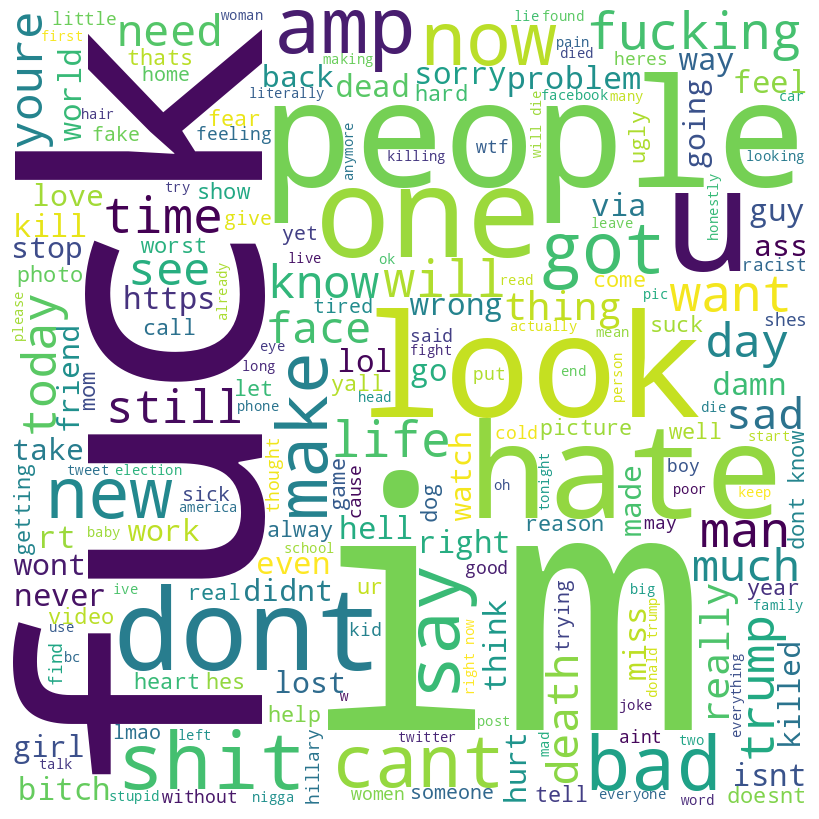

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Selecting only the rows with negative sentiment
negative_data = df[df['label'] == 0]

# Extracting the text from the 'text' column and joining into a single string
negative_text = " ".join(text for text in negative_data['text'])

# Generating the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', stopwords=STOPWORDS).generate(negative_text)

# Displaying the word cloud
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### Word Cloud for Positive Sentiments


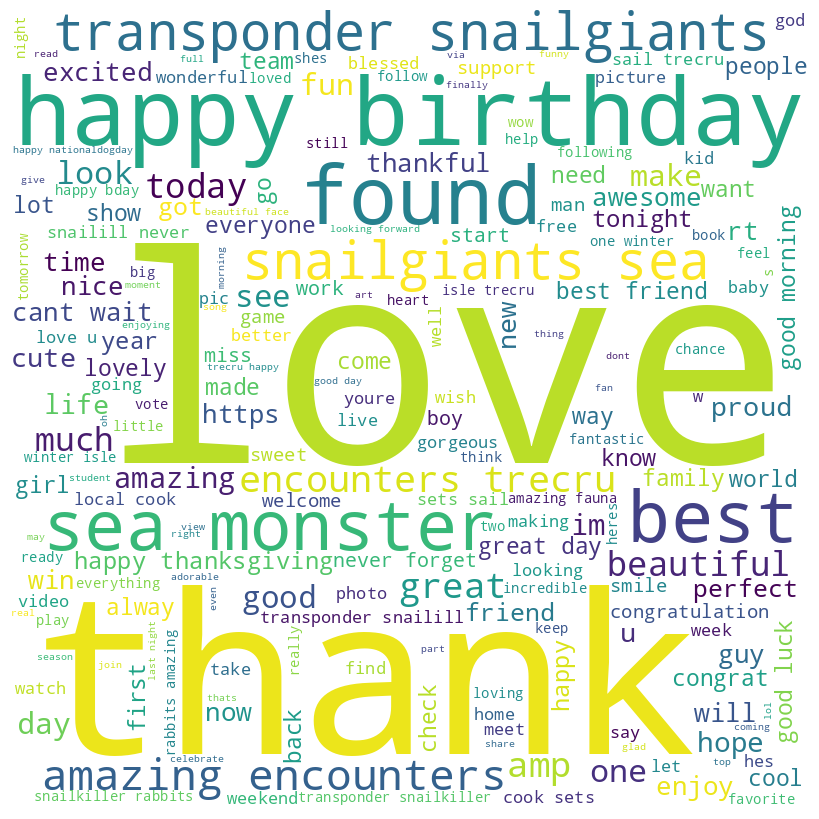

In [ ]:
# Selecting only the rows with positive sentiment
positive_data = df[df['label'] == 1]

# Extracting the text from the 'text' column and joining into a single string
positive_text = " ".join(text for text in positive_data['text'])

# Generating the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', stopwords=STOPWORDS).generate(positive_text)

# Displaying the word cloud
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
### Splitting the data into train and test and setting aside the test data for predictions
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df['text'], df['label'], test_size=0.2, random_state=42)

Whenever we apply any algorithm to textual data, we need to convert the text to a numeric form. Hence, there arises a need for some pre-processing techniques that can convert our text to numbers. Both bag-of-words (BOW) and TFIDF are pre-processing techniques that can generate a numeric form from an input text.

### Naive Bayes<br>


In [ ]:
# Creating a pipeline with TF-IDF vectorizer and Naive Bayes classifier
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('clf', MultinomialNB())
])

# Defining the hyperparameters to tune
parameters = {
    'tfidf__max_df': (0.5, 0.7, 0.9),
    'clf__alpha': (0.01, 0.05, 0.1, 1)
}

# Performing grid search with 5-fold cross-validation
grid_search = GridSearchCV(pipeline, parameters, cv=5, n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

# Printing the best parameters and score
print("Best parameters: ", grid_search.best_params_)
train_accuracy_nb = grid_search.score(X_train, y_train)
print("Train accuracy: ", train_accuracy_nb)
print("Avg validation score: ", grid_search.best_score_)

# Getting the best estimator from the grid search
best_estimator_nb = grid_search.best_estimator_

# Fitting the best estimator on the training data
best_estimator_nb.fit(X_train, y_train)

# Making predictions on the test data
y_pred_nb = best_estimator_nb.predict(X_test)

# Printing the classification report for the test set
print(classification_report(y_test, y_pred_nb))

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters:  {'clf__alpha': 0.1, 'tfidf__max_df': 0.5}
Train accuracy:  0.961661276549356
Avg validation score:  0.9321867230275511
              precision    recall  f1-score   support

           0       0.93      0.86      0.89     35854
           1       0.93      0.97      0.95     74225

    accuracy                           0.93    110079
   macro avg       0.93      0.91      0.92    110079
weighted avg       0.93      0.93      0.93    110079



**Summary**<br>
Best parameters:  {'clf__alpha': 0.1, 'tfidf__max_df': 0.5}<br>
Train accuracy:  0.9602668108068824<br>
Avg validation score:  0.9318551386168703<br>
Test accuracy: 0.93<br>
Test f1 score: 0.93

### Logistic Regression

In [ ]:
# Creating a pipeline with TF-IDF vectorizer and logistic regression classifier
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('clf', LogisticRegression(max_iter=1000))
])

# Defining the hyperparameters to tune
parameters = {
    'tfidf__max_df': (0.5, 0.7, 0.9),
    'clf__C': (0.01, 0.1, 1),
    'clf__solver': ('liblinear', 'lbfgs', 'sag')
}

# Performing grid search with 5-fold cross-validation
grid_search = GridSearchCV(pipeline, parameters, cv=5, n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

# Printing the best parameters and score
print("Best parameters: ", grid_search.best_params_)
train_accuracy_logistic = grid_search.score(X_train, y_train)
print("Train accuracy: ", train_accuracy_logistic)
print("Avg validation score: ", grid_search.best_score_)

# Getting the best estimator from the grid search
best_estimator_logistic = grid_search.best_estimator_

# Fitting the best estimator on the training data
best_estimator_logistic.fit(X_train, y_train)

# Making predictions on the test data
y_pred_logistic = best_estimator_logistic.predict(X_test)

# Printing the classification report for the test set
print(classification_report(y_test, y_pred_logistic))

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best parameters:  {'clf__C': 1, 'clf__solver': 'sag', 'tfidf__max_df': 0.7}
Train accuracy:  0.9820877014480641
Avg validation score:  0.9757149439403519
              precision    recall  f1-score   support

           0       0.97      0.96      0.97     35854
           1       0.98      0.98      0.98     74225

    accuracy                           0.98    110079
   macro avg       0.97      0.97      0.97    110079
weighted avg       0.98      0.98      0.98    110079



**Summary**<br>
Best parameters:  {'clf__C': 1, 'clf__solver': 'sag', 'tfidf__max_df': 0.5}<br>
Train accuracy:  0.9820877014480641<br>
Avg validation score:  0.9757149439403519<br>
Test accuracy: 0.98<br>
Test F1 score: 0.98<br>

Hence both train and test sets have very good accuracy and the model does not overfit

### Random Forests

In [ ]:
# Creating a pipeline with TfidfVectorizer and RandomForestClassifier
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('clf', RandomForestClassifier())
])

# Defining the hyperparameters to tune
parameters = {
    'tfidf__max_df': (0.5, 1.0),
    'clf__n_estimators': [50, 100, 200],
    'clf__max_depth': [5, 10],
}

# Performing grid search with 5-fold cross-validation
grid_search = GridSearchCV(pipeline, parameters, cv=5, n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

# Printing the best parameters and score
print("Best parameters: ", grid_search.best_params_)
train_accuracy_rf = grid_search.score(X_train, y_train)
print("Train accuracy: ", train_accuracy_rf)
print("Avg validation score: ", grid_search.best_score_)

# Getting the best estimator from the grid search
best_estimator_rf = grid_search.best_estimator_

# Fitting the best estimator on the training data
best_estimator_rf.fit(X_train, y_train)

# Making predictions on the test data
y_pred_rf = best_estimator_rf.predict(X_test)

# Printing the classification report for the test set
print(classification_report(y_test, y_pred_rf))

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters:  {'clf__max_depth': 5, 'clf__n_estimators': 50, 'tfidf__max_df': 0.5}
Train accuracy:  0.6747851523465179
Avg validation score:  0.6747851523519269
              precision    recall  f1-score   support

           0       0.00      0.00      0.00     35854
           1       0.67      1.00      0.81     74225

    accuracy                           0.67    110079
   macro avg       0.34      0.50      0.40    110079
weighted avg       0.45      0.67      0.54    110079



**Summary**<br>
Best parameters:  {'clf__max_depth': 5, 'clf__n_estimators': 50, 'tfidf__max_df': 0.5}<br>
Train accuracy:  0.6747851523465179<br>
Avg validation score:  0.6747851523519269<br>
Test accuracy: 0.67<br>
Test F1 score: 0.54<br>

Overall, the model is achieving a moderate level of accuracy on both the training and validation sets. The accuracy on test set is also almost comparable. This shows the model does not overfits<br>
However, the f1 score on the test set is very moderate. The model is not able to predict negative tweets effectively.<br>


### Decision Trees

In [ ]:
# Defining the pipeline with TfidfVectorizer and Decision Tree classifier
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('clf', DecisionTreeClassifier(random_state=42))
])

# Defining the hyperparameters to tune
parameters = {
    'tfidf__max_df': (0.5, 0.7, 0.9),
    'clf__max_depth': (5, 10,15),
    'clf__min_samples_split': (5, 10,20),
    }

# Performing grid search with 5-fold cross-validation
grid_search = GridSearchCV(pipeline, parameters, cv=5, n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

# Printing the best parameters and score
print("Best parameters: ", grid_search.best_params_)
train_accuracy_dt = grid_search.score(X_train, y_train)
print("Train accuracy: ", train_accuracy_dt)
print("Avg validation score: ", grid_search.best_score_)

# Getting the best estimator from the grid search
best_estimator_dt = grid_search.best_estimator_

# Fitting the best estimator on the training data
best_estimator_dt.fit(X_train, y_train)

# Making predictions on the test data
y_pred_dt = best_estimator_dt.predict(X_test)

# Printing the classification report for the test set
print(classification_report(y_test, y_pred_dt))

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best parameters:  {'clf__max_depth': 15, 'clf__min_samples_split': 5, 'tfidf__max_df': 0.5}
Train accuracy:  0.769022874688857
Avg validation score:  0.7675421061225705
              precision    recall  f1-score   support

           0       0.58      0.98      0.73     35854
           1       0.99      0.66      0.79     74225

    accuracy                           0.77    110079
   macro avg       0.79      0.82      0.76    110079
weighted avg       0.86      0.77      0.77    110079



**Summary**<br>
Best parameters:  {'clf__max_depth': 15, 'clf__min_samples_split': 5, 'tfidf__max_df': 0.5}<br>
Train accuracy:  0.769022874688857<br>
Avg validation score:  0.7675421061225705<br>
Test accuracy: 0.77<br>
Test F1 score: 0.77<br>

Overall, the model is achieving a moderate level of accuracy on both the training and validation sets. The accuracy and the F1 score on test set are also almost comparable. This shows the model does not overfit.<br>

To summarize it all, the best accuracy and F1 scores are obtained when Logistic Regression is used to classify text and identify sentiments.

**Best Model: Logistic Regression**

## Sentiment Classification

### Comparing the Finalized Model with VADER, A Pre-Trained Sentiment Classification Model

In [ ]:
vader_model = SentimentIntensityAnalyzer()
vader_predictions = []
for text in X_test:
    score = vader_model.polarity_scores(text)
    if score['compound'] > 0:
        vader_predictions.append(1)
    else:
        vader_predictions.append(0)

# Calculating accuracy and confusion matrix for Vader model
vader_accuracy = accuracy_score(y_test, vader_predictions)
vader_confusion_matrix = confusion_matrix(y_test, vader_predictions)

print('Vader Model:')
print('Accuracy:', vader_accuracy*100,'%')
print('Confusion Matrix:\n', vader_confusion_matrix)

print(classification_report(y_test, vader_predictions))

Vader Model:
Accuracy: 88.63452611306425 %
Confusion Matrix:
 [[28743  7111]
 [ 5400 68825]]
              precision    recall  f1-score   support

           0       0.84      0.80      0.82     35854
           1       0.91      0.93      0.92     74225

    accuracy                           0.89    110079
   macro avg       0.87      0.86      0.87    110079
weighted avg       0.89      0.89      0.89    110079



### Using VADER to Classify Sentiments of New Russo-Ukrainian War Related Datasets

Datasets are taken from a variety of sources listed below:

**1.   Reddit**
<ol type = "a">
<li> Dataset 1 - Ukraine conflict (reddit_raw_ukraine_russia.csv)</li>
<li> Dataset 2 - Webscraped data from Reddit</li>
</ol>

**2.   Twitter**
<ol type = "a">
<li> Dataset 1 - Elon Musk (tw_reply.csv)</li>
<li> Dataset 2 - Webscraped data from Twitter</li>
<li> Dataset 3 - Public sentiments from August 2022 to March 2023</li>
</ol>

**3.   News**
<ol type = "a">
<li> Dataset 1 - CNN News</li>
<li> Dataset 2 - FOX News</li>
</ol>

### 1a. Reddit<br>
Dataset 1 - Ukraine conflict (reddit_raw_ukraine_russia.csv)

In [ ]:
new_data = pd.read_csv('/content/reddit_raw_ukraine_russia.csv')

In [ ]:
new_data = new_data.tail(-1)
new_data['comments'] = new_data['comments'].str.replace('\n', '')
new_data['comments'] = clean_tweets(new_data['comments'])
new_data.drop(columns=['Unnamed: 0','post_id','comment_id'], axis=1, inplace=True)
new_data = new_data.reset_index(drop=True)

We need to generate sentiments for all the tweets of Part 2 dataset before predicting using the best model, logreg.<br>
This helps to determine the accuracy of the model later on.<br>Thus, we are using the pre-trained model to first generate the sentiments for all the tweets in this dataset.

In [ ]:
vader_model = SentimentIntensityAnalyzer()
scores=[]

for i in range(new_data['comments'].shape[0]):
  comment = new_data['comments'][i] # checking if it's a float
  if isinstance(comment, float):
    comment = str(comment)  # converting to string
  compound = vader_model.polarity_scores(comment)["compound"]
  scores.append(compound)

sentiments_score = pd.Series(scores)
new_data['compound'] = sentiments_score
conditions = [
    (new_data['compound'] <= -0.5),
    (new_data['compound'] > -0.5) & (new_data['compound'] < 0.5),
    (new_data['compound'] > 0.5)
    ]

# creating a list of the values we want to assign for each condition
values = ['Negative', 'Neutral', 'Positive']

# creating a new column and using np.select to assign values to it using our lists as arguments
new_data['Category'] = np.select(conditions, values)
new_data.head()

,comments,date,compound,Category
0,poland also announced that they plan to double...,2022-06-27,0.6908,Positive
1,"remember, nato knows more than were being told...",2022-06-27,0.2500,Neutral
2,"well done, putin. top 2022 salesman of nato. b...",2022-06-27,-0.9708,Negative
3,very good decision - russians are incapable of...,2022-06-27,0.5563,Positive
4,this looks familiar...,2022-06-27,0.0000,Neutral


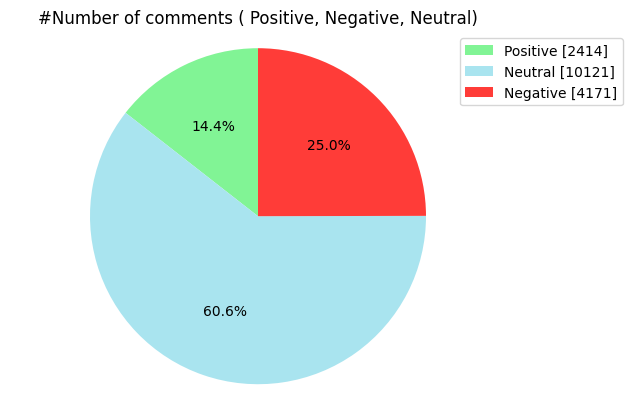

In [ ]:
positive= len(new_data[new_data['Category'] == 'Positive'])
neutral= len(new_data[new_data['Category'] == 'Neutral'])
negative= len(new_data[new_data['Category'] == 'Negative'])

#Creating PieChart
labels = ['Positive ['+str(positive)+']' , 'Neutral ['+str(neutral)+']','Negative ['+str(negative)+']']
sizes = [positive, neutral, negative]
colors = ["#81F495","#A9E4EF","#FF3C38"]
plt.pie(sizes,colors=colors, autopct='%1.1f%%',startangle=90)
plt.style.use('default')
plt.legend(labels, bbox_to_anchor=(1.25, 1.0), loc=1)
plt.title( '#Number of comments ( Positive, Negative, Neutral)' )
plt.axis('equal')
plt.show()

In [ ]:
#### Extracting only positive and negative sentiments from the dataframe

new_data_df = new_data[new_data['Category'].isin(['Positive','Negative'])]
mapping = {'Positive':1, 'Negative':0}
new_data_df['Category'] = new_data_df['Category'].map(mapping)
y_actual_new_data = new_data_df['Category']

Predicting the labels of the dataset using the best model obtained in part 1 (Logistic Regression)

In [ ]:
y_pred_new_data = best_estimator_logistic.predict(new_data_df['comments'])
unique_values, unique_counts = np.unique(y_pred_new_data, return_counts=True)

print(unique_values,unique_counts)
accuracy_new_data = accuracy_score(y_pred_new_data, y_actual_new_data)

print('Accuracy =', accuracy_new_data)
print(classification_report(y_actual_new_data, y_pred_new_data))
new_data_df['Predicted values'] = y_pred_new_data

[0 1] [5501 1084]
Accuracy = 0.7719058466211086
              precision    recall  f1-score   support

           0       0.74      0.98      0.84      4171
           1       0.92      0.41      0.57      2414

    accuracy                           0.77      6585
   macro avg       0.83      0.70      0.71      6585
weighted avg       0.81      0.77      0.74      6585



Thus, the Russia Ukraine reddit dataset tested on the trained logistic regression model gives an accuracy of 76.7%

#### Word Clouds of Positive and Negative Sentiments

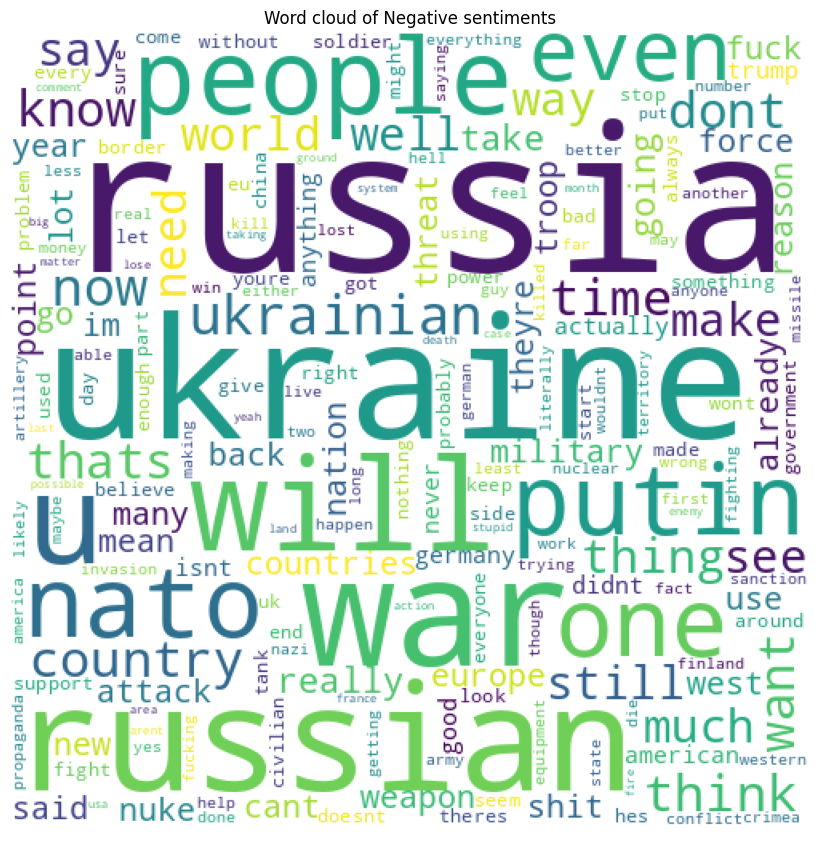

<Figure size 640x480 with 0 Axes>

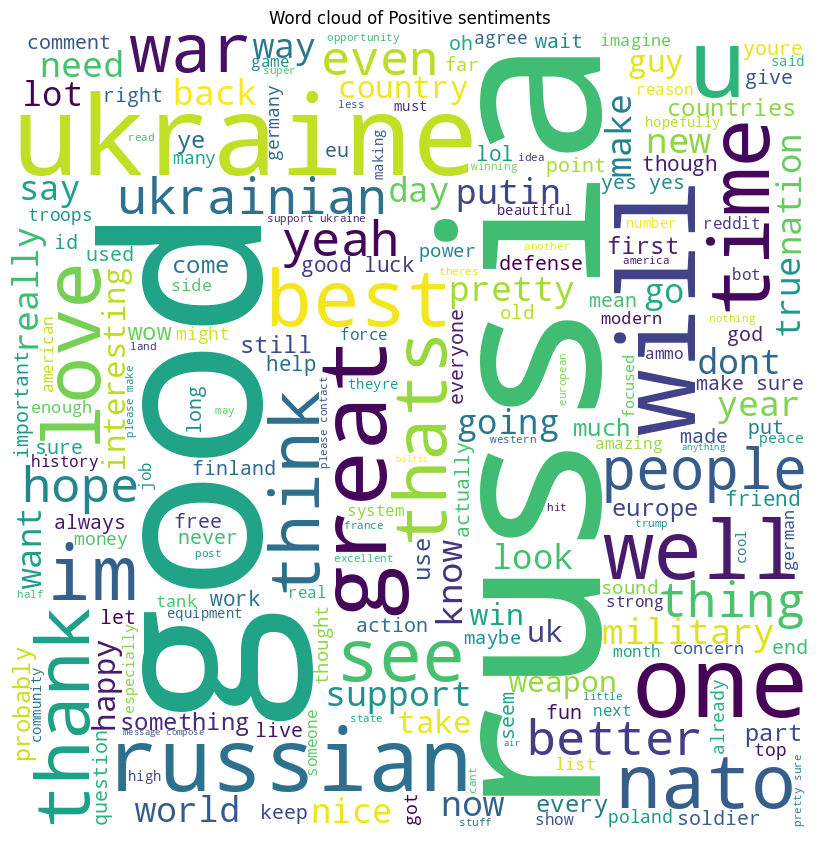

In [ ]:
# Selecting only the rows with negative sentiment
negative_data = new_data_df[new_data_df['Predicted values'] == 0]

# Extracting the text from the 'text' column and joining into a single string
negative_text = " ".join(text for text in negative_data['comments'])

# Generating the word cloud
wordcloud = WordCloud(width=500, height=500, background_color='white', stopwords=STOPWORDS).generate(negative_text)

# Displaying the word cloud
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title('Word cloud of Negative sentiments')
plt.show()

plt.subplots_adjust(wspace = 0.5)

# Selecting only the rows with positive sentiment
positive_data = new_data_df[new_data_df['Predicted values'] == 1]

# Extracting the text from the 'text' column and joining into a single string
positive_text = " ".join(text for text in positive_data['comments'])

# Generating the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', stopwords=STOPWORDS).generate(positive_text)

# Displaying the word cloud
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title('Word cloud of Positive sentiments')
plt.show()

In [ ]:
new_data_df['date'] = pd.to_datetime(new_data_df['date'])
new_data_df.set_index('date', inplace=True)

#### Factor and Topics Identification via Machine Learning

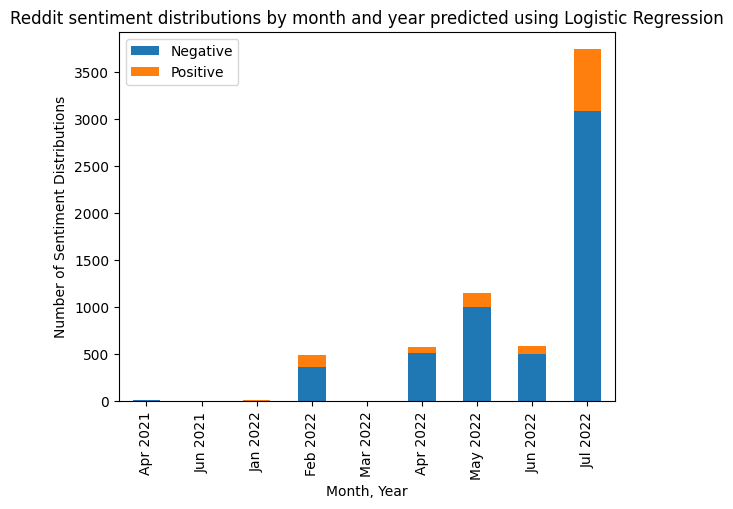

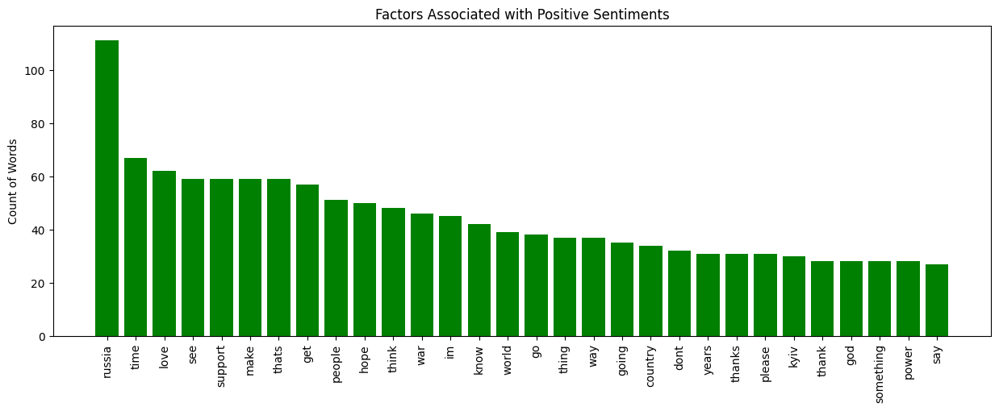

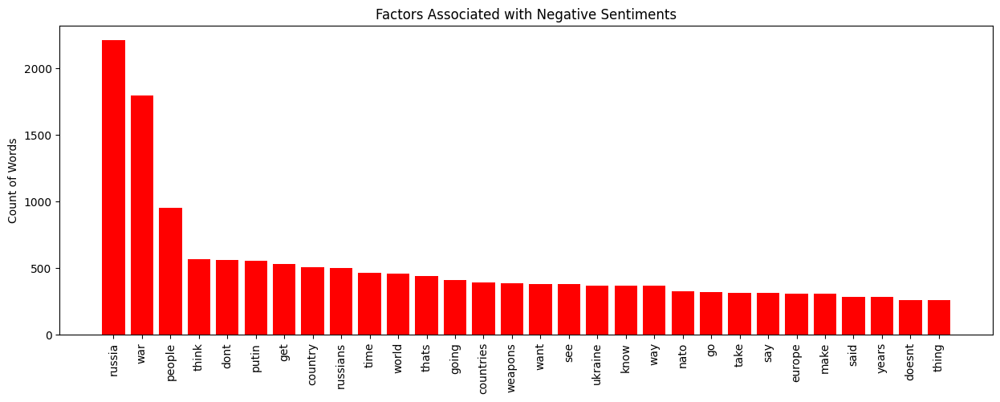

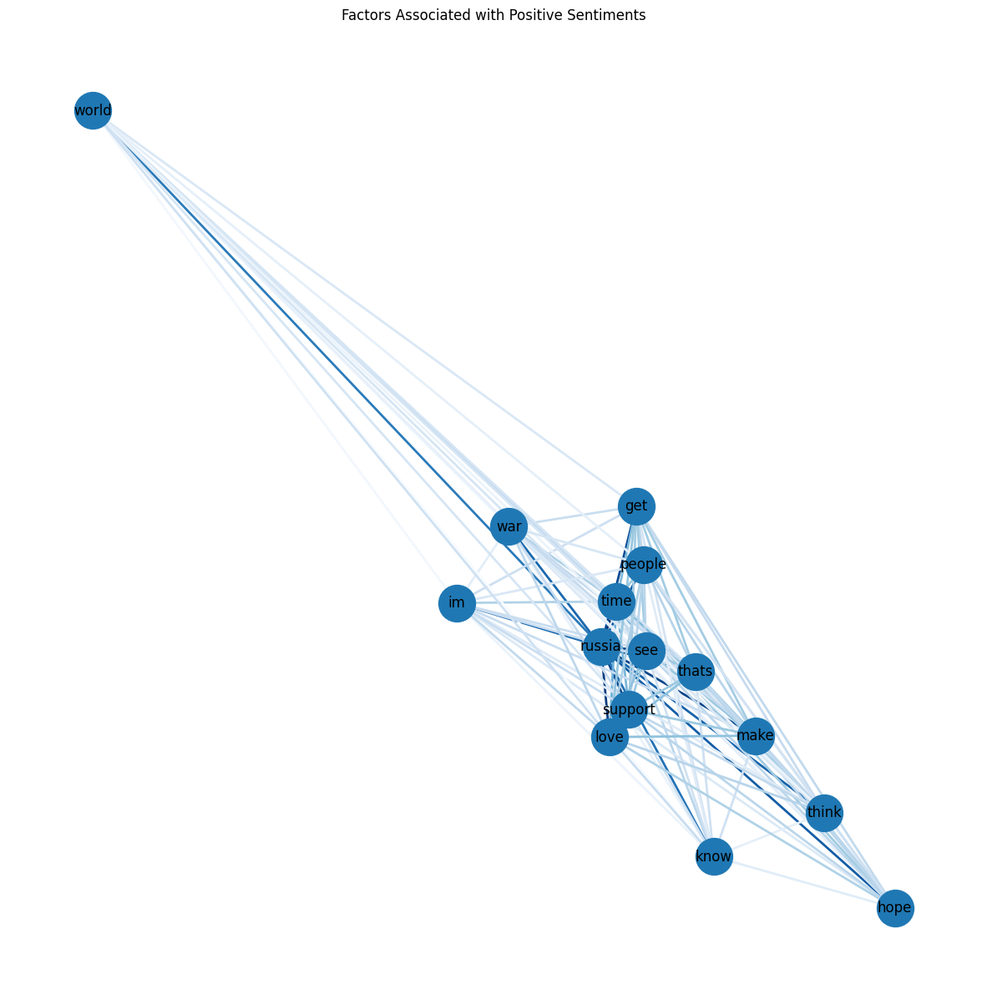

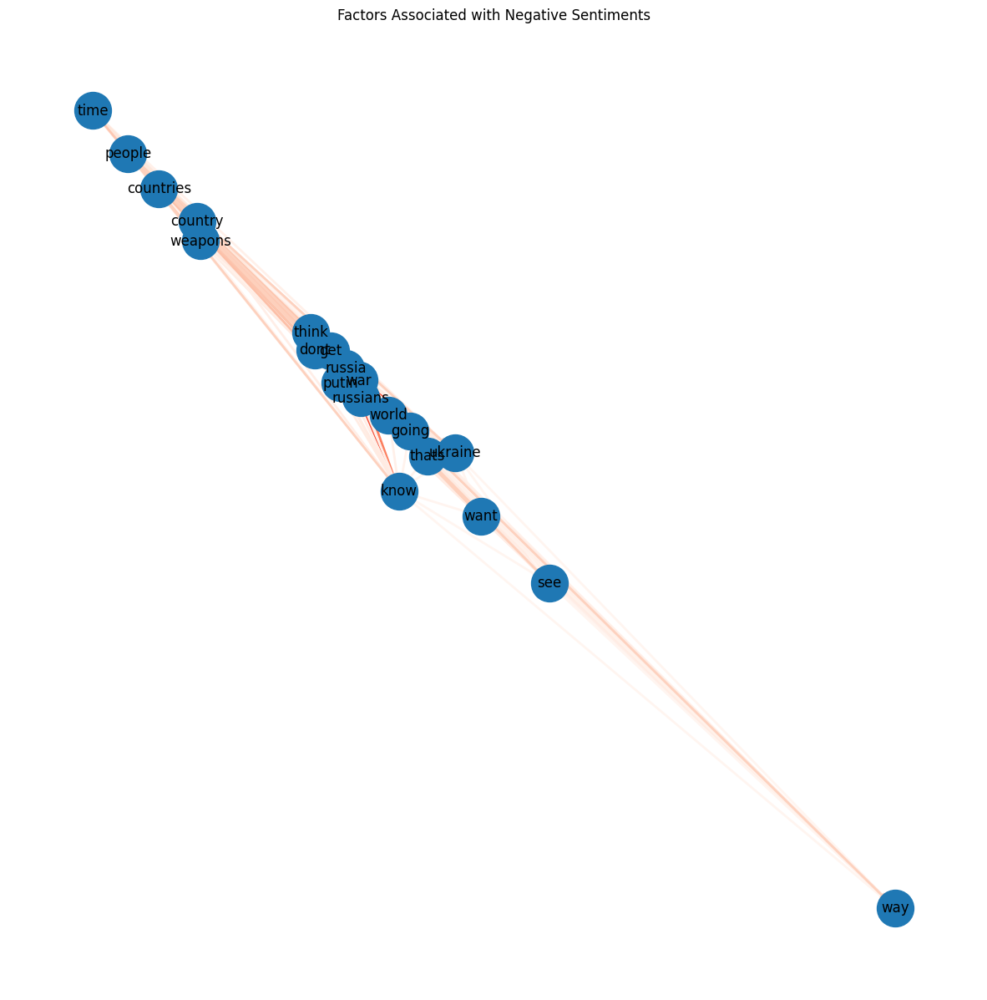

In [ ]:
#################################### Reddit sentiment distributions by month and year

# Creating new columns for sentiment labels
new_data_df['Negative'] = (new_data_df['Predicted values'] == 0).astype(int)
new_data_df['Positive'] = (new_data_df['Predicted values'] == 1).astype(int)

# Grouping by month and year and aggregating sum of sentiment columns
monthly_sentiment = new_data_df.groupby([new_data_df.index.year, new_data_df.index.month]).agg({'Negative': 'sum', 'Positive': 'sum'})

# Plotting stacked bar graph
monthly_sentiment.plot(kind='bar', stacked=True)

# Modifying x-axis to display month and year labels
labels = [datetime.datetime(year=x[0], month=x[1], day=1) for x in monthly_sentiment.index]
labels = [x.strftime('%b %Y') for x in labels]
plt.xticks(range(len(labels)), labels)

plt.xlabel('Month, Year')
plt.ylabel('Number of Sentiment Distributions')
plt.title('Reddit sentiment distributions by month and year predicted using Logistic Regression')
plt.show()

#################################### Unigrams

def extract_factors(text):
    tokens = word_tokenize(text.lower())
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [token for token in tokens if token not in stop_words and token.isalpha()]
    factors = []
    for token, pos in nltk.pos_tag(filtered_tokens):
        if pos.startswith('NN') or pos.startswith('VB'):
            factors.append(token)
    return factors

# Creating a list of factors and their associated sentiments
factors_sentiments = []
for index, row in new_data_df.iterrows():
    factors = extract_factors(row['comments'])
    for factor in factors:
        factors_sentiments.append((factor, row['Predicted values']))

# Creating a bar chart of factors associated with positive sentiments
label = "Count of Words"
positive_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 1]
positive_counts = Counter(positive_factors).most_common(30)
positive_factors = [x[0] for x in positive_counts]
positive_counts = [x[1] for x in positive_counts]
fig, ax = plt.subplots(figsize=(15, 5))
ax.bar(range(len(positive_counts)), positive_counts, align='center', color='green')
ax.set_xticks(range(len(positive_factors)))
ax.set_xticklabels(positive_factors, rotation='vertical')
ax.set_title('Factors Associated with Positive Sentiments')
ax.set_ylabel(label)
plt.show()

# Creating a bar chart of factors associated with negative sentiments
negative_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 0]
negative_counts = Counter(negative_factors).most_common(30)
negative_factors = [x[0] for x in negative_counts]
negative_counts = [x[1] for x in negative_counts]
fig, ax = plt.subplots(figsize=(15, 5))
ax.bar(range(len(negative_counts)), negative_counts, align='center', color='red')
ax.set_xticks(range(len(negative_factors)))
ax.set_xticklabels(negative_factors, rotation='vertical')
ax.set_title('Factors Associated with Negative Sentiments')
ax.set_ylabel(label)
plt.show()

################################## Network Graphs

random.seed(0)

# Creating a network graph of factors associated with positive sentiments
positive_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 1]
positive_counts = Counter(positive_factors)
positive_top_factors = positive_counts.most_common(15)
positive_top_factors = [factor[0] for factor in positive_top_factors]
positive_graph = nx.DiGraph()
for factor, sentiment in factors_sentiments:
    if factor in positive_top_factors:
        positive_graph.add_node(factor)
for i in range(len(positive_top_factors)):
    for j in range(i+1, len(positive_top_factors)):
        count = 0
        for factor, sentiment in factors_sentiments:
            if factor == positive_top_factors[i] and sentiment == 1:
                count += 1
            elif factor == positive_top_factors[j] and sentiment == 1:
                count += 1
        if count > 0:
            positive_graph.add_edge(positive_top_factors[i], positive_top_factors[j], weight=count)

# Plotting the network graph
plt.figure(figsize=(15,15))
pos = nx.spring_layout(positive_graph, k=0.5, seed=0)
nx.draw_networkx_nodes(positive_graph, pos, node_size=1000)
nx.draw_networkx_labels(positive_graph, pos, font_size=12)
edges = positive_graph.edges()
weights = [positive_graph[u][v]['weight'] for u,v in edges]
nx.draw_networkx_edges(positive_graph, pos, edgelist=edges, edge_color=weights, edge_cmap=plt.cm.Blues, edge_vmin=min(weights), edge_vmax=max(weights), arrowsize=10, width=2)
plt.axis('off')
plt.title('Factors Associated with Positive Sentiments')
plt.show()

random.seed(2)

# Creating a network graph of factors associated with negative sentiments
negative_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 0]
negative_counts = Counter(negative_factors)
negative_top_factors = negative_counts.most_common(20)
negative_top_factors = [factor[0] for factor in negative_top_factors]
negative_graph = nx.DiGraph()
for factor, sentiment in factors_sentiments:
    if factor in negative_top_factors:
        negative_graph.add_node(factor)
for i in range(len(negative_top_factors)):
    for j in range(i+1, len(negative_top_factors)):
        count = 0
        for factor, sentiment in factors_sentiments:
            if factor == negative_top_factors[i] and sentiment == 0:
                count += 1
            elif factor == negative_top_factors[j] and sentiment == 0:
                count += 1
        if count > 0:
            negative_graph.add_edge(negative_top_factors[i], negative_top_factors[j], weight=count)


# Plotting the network graph
plt.figure(figsize=(15,15))
pos = nx.spring_layout(negative_graph, k=0.5, seed=2)
nx.draw_networkx_nodes(negative_graph, pos, node_size=1000)
nx.draw_networkx_labels(negative_graph, pos, font_size=12)
edges = negative_graph.edges()
weights = [negative_graph[u][v]['weight'] for u,v in edges]
nx.draw_networkx_edges(negative_graph, pos, edgelist=edges, edge_color=weights, edge_cmap=plt.cm.Reds, edge_vmin=min(weights), edge_vmax=max(weights), arrowsize=10, width=2)
plt.axis('off')
plt.title('Factors Associated with Negative Sentiments')
plt.show()

From the above unigrams, we can see that for positive sentiments, some of the words like support, thanks, luck, hope and fun are major contributors towards the positive sentiment.</br></br> Similarly, we can see that some of the words like war, weapons, nukes, power, forces and threat are major contributors towards the negative sentiment.


What is a network graph?<br>
In short, a network graph draws correlation between various elements (or nodes) in a network. <br>
Russia is in the centre of the cluster for negative sentiments, making it a hub of violence. We can verify that the words "Nukes" and "Russia" are strongly related making it a high concern.

For Reddit Dataset 1, which consisted of reddit threads, our sentiment classification model achieved an accuracy of 77%. This indicates that the model was able to correctly classify the sentiment of most of the reddit threads. The model classified 14.4% of the reviews as positive, 60.6% as neutral, and 25% as negative. The dataset contains data within the timeframe of Apr 2021- Jul2022 and thus the majority of threads had a neutral sentiment as most of the timeperiod covered here was before the instigation by Russia. However, we can see that the negative sentiments rose sharply after the instigation resulting in its high percentage over positive sentiment.

#### Visualizations, Storytelling, Recommendations

In [ ]:
!pip install bertopic
from umap import UMAP
from bertopic import BERTopic

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 120.7/120.7 KB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 KB 8.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 KB 9.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 47.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 73.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 60.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.8/199.8 KB 20.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 58.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     

In [ ]:
################################ Bert

umap_model = UMAP(random_state=1122)
bert_topic_model= BERTopic(embedding_model = "all-MiniLM-L6-v2", umap_model=umap_model)

stop_words = set(stopwords.words('english'))
new_data_df['comments'] = new_data_df['comments'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words]))

bert_negative = new_data_df[new_data_df['Predicted values']==0]
bert_negative = bert_negative.comments.tolist()
topics, probs = bert_topic_model.fit_transform(bert_negative)


In [ ]:
bert_topic_model.visualize_barchart()

**BERTopic Modeling:**<br>
BERTopic is a topic modeling technique that is based on the BERT (Bidirectional Encoder Representations from Transformers) algorithm. It uses pre-trained language models to create dense representations of the input text and then clusters similar documents together based on their content.<br>

Based on the above graph, with the help of bert modeling, 8 topics are captured that entails the essential information about the on-going war. Bert modeling is very helpful for making recommendations as the information obtained captures broader events. Most relevant words are grouped together for every topic. For further info on how bert helped with recommendations, kindly refer the recommendations section.

Topic 1:
ukraine, russia, good, sure, like, nato, make, great, support, im
Topic 2:
good, russia, ukraine, like, yes, best, thats, military, love, im
Topic 3:
good, ukraine, russia, great, pretty, people, think, time, stay, war
Topic 4:
like, great, best, time, ukraine, think, support, way, russian, hope
Topic 5:
great, like, love, thank, time, ukraine, yes, really, thing, god


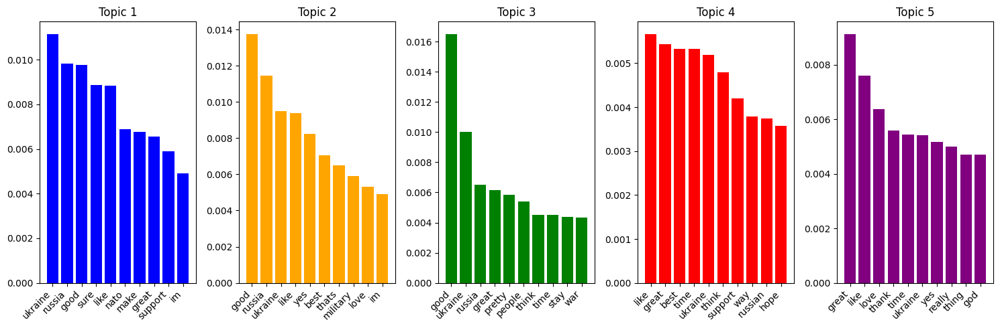

In [ ]:
#################################### LDA

lda_positive_reddit = new_data_df[new_data_df['Predicted values']==1]

vectorizer = CountVectorizer(stop_words='english')
positive_topics_reddit = vectorizer.fit_transform(lda_positive_reddit['comments'])

# Applying LDA to the document-term matrix
n_topics = 5
lda = LatentDirichletAllocation(n_components=n_topics, random_state=0)
lda.fit(positive_topics_reddit)

# Getting the most representative words or phrases for each topic
feature_names_reddit = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(lda.components_):
    top_words = [feature_names_reddit[i] for i in topic.argsort()[:-10 - 1:-1]]
    print("Topic %d:" % (topic_idx + 1))
    print(", ".join(top_words))

n_words = 10

# Getting the importance of each word in each topic
word_importance_reddit = lda.components_ / lda.components_.sum(axis=1)[:, np.newaxis]

# Defining the colors for each topic
colors = ['blue', 'orange', 'green', 'red', 'purple']

# Create a 1x5 grid of subplots
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(15, 5))

# Flattening the array of subplots so we can iterate over them
axes = axes.flatten()

# Plotting the bar graph for each topic
for i in range(n_topics):
    ax = axes[i]
    ax.bar(np.arange(n_words), word_importance_reddit[i][np.argsort(word_importance_reddit[i])[:-n_words-1:-1]], color=colors[i])
    ax.set_xticks(np.arange(n_words))
    ax.set_xticklabels(np.array(feature_names_reddit)[np.argsort(word_importance_reddit[i])[:-n_words-1:-1]], rotation=45, ha='right')
    ax.set_title("Topic {}".format(i+1))

# Hiding any unused subplots
for i in range(n_topics, len(axes)):
    axes[i].axis('off')

# Adjusting spacing between subplots
fig.tight_layout()

plt.show()

**Latent Dirichlet Allocation**<br>
LDA (Latent Dirichlet Allocation) is a statistical model used for topic modeling, which is the process of identifying topics or themes in a collection of documents. The goal of LDA is to uncover the underlying topics in a corpus of text and assign each document a distribution of topics.

The output of LDA is a set of topics, each represented by a distribution of words. These topics can be interpreted by looking at the most frequent words in each topic and can be used to understand the themes or topics present in the corpus.

### 1b. Reddit<br>
Dataset 2 - Webscrapped data from Reddit

Scrapping Code

In [ ]:
'''import pandas as pd
import requests
import json
import csv
import time
import datetime'''
'''search_urwar = "https://api.pushshift.io/reddit/search/submission/?q=Ukraine&after=1645660800&before=1679702400&subreddit=worldnews"

# "https://api.pushshift.io/reddit/search/submission/?q=Ukraine&after=1645660800&before=1679702400&subreddit=worldnews"'''
'''

def getPushshiftData(query, after, before, sub):
    #Build URL
    url = 'https://api.pushshift.io/reddit/search/submission/?title='+str(query)+'&size=1000&after='+str(after)+'&before='+str(before)+'&subreddit='+str(sub)
    #Print URL to show user
    print(url)
    #Request URL
    r = requests.get(url)
    #Load JSON data from webpage into data variable
    data = json.loads(r.text)
    #return the data element which contains all the submissions data
    return data['data']

'''
'''

def collectSubData(subm):
    #subData was created at the start to hold all the data which is then added to our global subStats dictionary.
    subData = list() #list to store data points
    title = subm['title']
    url = subm['url']
    #flairs are not always present so we wrap in try/except
    try:
        flair = subm['link_flair_text']
    except KeyError:
        flair = "NaN"
    author = subm['author']
    sub_id = subm['id']
    score = subm['score']
    created = datetime.datetime.fromtimestamp(subm['created_utc']) #1520561700.0
    numComms = subm['num_comments']
    permalink = subm['permalink']

    #Put all data points into a tuple and append to subData
    subData.append((sub_id,title,url,author,score,created,numComms,permalink,flair))
    #Create a dictionary entry of current submission data and store all data related to it
    subStats[sub_id] = subData

    '''

'''


after = "1664514335" #Submissions after this timestamp
before = "1672466735" #Submissions before this timestamp
query = "Ukraine" #Keyword(s) to look for in submissions
sub = "worldnews" #Which Subreddit to search in

#subCount tracks the no. of total submissions we collect
subCount = 0
#subStats is the dictionary where we will store our data.
subStats = {}

'''

'''

data = getPushshiftData(query, after, before, sub)
# Will run until all posts have been gathered i.e. When the length of data variable = 0
# from the 'after' date up until before date
while len(data) > 0: #The length of data is the number submissions (data[0], data[1] etc), once it hits zero (after and before vars are the same) end
    for submission in data:
        collectSubData(submission)
        subCount+=1
    # Calls getPushshiftData() with the created date of the last submission
    print(len(data))
    print(str(datetime.datetime.fromtimestamp(data[-1]['created_utc'])))
    #update after variable to last created date of submission
    after = data[-1]['created_utc']
    #data has changed due to the new after variable provided by above code
    data = getPushshiftData(query, after, before, sub)

print(len(data))

'''

'''print(str(len(subStats)) + " submissions have added to list")
print("1st entry is:")
print(list(subStats.values())[0][0][1] + " created: " + str(list(subStats.values())[0][0][5]))
print("Last entry is:")
print(list(subStats.values())[-1][0][1] + " created: " + str(list(subStats.values())[-1][0][5]))'''

'''def updateSubs_file():
    upload_count = 0
    #location = "\\Reddit Data\\" >> If you're running this outside of a notebook you'll need this to direct to a specific location
    print("input filename of submission file, please add .csv")
    filename = input() #This asks the user what to name the file
    file = filename
    with open(file, 'w', newline='', encoding='utf-8') as file:
        a = csv.writer(file, delimiter=',')
        headers = ["Post ID","Title","Url","Author","Score","Publish Date","Total No. of Comments","Permalink","Flair"]
        a.writerow(headers)
        for sub in subStats:
            a.writerow(subStats[sub][0])
            upload_count+=1

        print(str(upload_count) + " submissions have been uploaded")
updateSubs_file()'''

'def updateSubs_file():\n    upload_count = 0\n    #location = "\\Reddit Data\\" >> If you\'re running this outside of a notebook you\'ll need this to direct to a specific location\n    print("input filename of submission file, please add .csv")\n    filename = input() #This asks the user what to name the file\n    file = filename\n    with open(file, \'w\', newline=\'\', encoding=\'utf-8\') as file: \n        a = csv.writer(file, delimiter=\',\')\n        headers = ["Post ID","Title","Url","Author","Score","Publish Date","Total No. of Comments","Permalink","Flair"]\n        a.writerow(headers)\n        for sub in subStats:\n            a.writerow(subStats[sub][0])\n            upload_count+=1\n            \n        print(str(upload_count) + " submissions have been uploaded")\nupdateSubs_file()'

In [ ]:
r_ukraine_2021 = pd.read_csv('r_ukraine_2021.csv')
r_ukraine_2022 = pd.read_csv('r_ukraine_2022.csv')
r_ukraine_2023 = pd.read_csv('r_ukraine_2023.csv')
r_ukraine = pd.concat([r_ukraine_2021, r_ukraine_2022, r_ukraine_2023], ignore_index=True)
r_ukraine['Title'] = clean_tweets(r_ukraine['Title'])
r_ukraine['Title'].head()

0      what does it mean to call someone a біла кістка
1    україну та деякі сусідні країни можна помножув...
2            defenders and defendresses of ukraine day
3              opera house from reshelevskaya street..
4                                      deleted by user
Name: Title, dtype: object

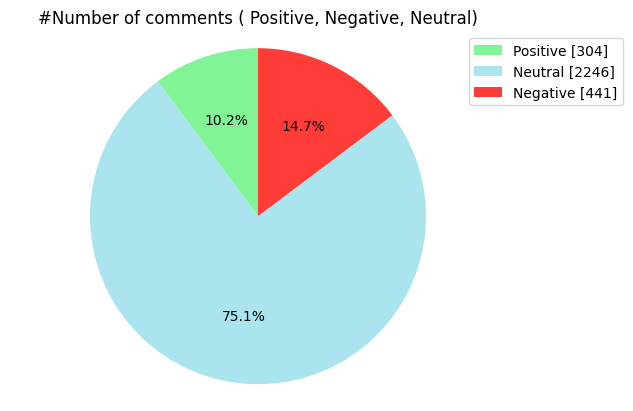

In [ ]:
scores_reddit = []

for i in range(r_ukraine['Title'].shape[0]):
  compound = vader_model.polarity_scores(r_ukraine['Title'][i])["compound"]
  scores_reddit.append(compound)

sentiments_score_reddit = pd.Series(scores_reddit)
r_ukraine['Compound'] = sentiments_score_reddit

conditions = [
    (r_ukraine['Compound'] <= -0.5),
    (r_ukraine['Compound'] > -0.5) & (r_ukraine['Compound'] < 0.5),
    (r_ukraine['Compound'] > 0.5)
    ]

# creating a list of the values we want to assign for each condition
values = ['Negative', 'Neutral', 'Positive']

# creating a new column and using np.select to assign values to it using our lists as arguments
r_ukraine['Category'] = np.select(conditions, values)

positive_reddit= len(r_ukraine[r_ukraine['Category'] == 'Positive'])
neutral_reddit= len(r_ukraine[r_ukraine['Category'] == 'Neutral'])
negative_reddit= len(r_ukraine[r_ukraine['Category'] == 'Negative'])

#Creating PieChart
labels = ['Positive ['+str(positive_reddit)+']' , 'Neutral ['+str(neutral_reddit)+']','Negative ['+str(negative_reddit)+']']
sizes = [positive_reddit, neutral_reddit, negative_reddit]
colors = ["#81F495","#A9E4EF","#FF3C38"]
plt.pie(sizes,colors=colors, autopct='%1.1f%%',startangle=90)
plt.style.use('default')
plt.legend(labels, bbox_to_anchor=(1.25, 1.0), loc=1)
plt.title( '#Number of comments ( Positive, Negative, Neutral)' )
plt.axis('equal')
plt.show()

In [ ]:
#### Extracting only positive and negative sentiments from the dataframe

r_ukraine = r_ukraine[r_ukraine['Category'].isin(['Positive','Negative'])]
mapping = {'Positive':1, 'Negative':0}
r_ukraine['Category'] = r_ukraine['Category'].map(mapping)
y_actual_r_ukraine = r_ukraine['Category']

Predicting the labels of part 2 dataset using the best model obtained in part 1 (Logistic Regression)

In [ ]:
y_pred_logreg_r_ukraine = best_estimator_logistic.predict(r_ukraine['Title'])
print(classification_report(y_actual_r_ukraine, y_pred_logreg_r_ukraine))
r_ukraine['predicted_values_logreg'] = y_pred_logreg_r_ukraine
r_ukraine.drop(columns=['Compound'], axis=1, inplace=True)
r_ukraine = r_ukraine.reset_index(drop=True)

              precision    recall  f1-score   support

           0       0.85      0.97      0.90       441
           1       0.94      0.74      0.83       304

    accuracy                           0.88       745
   macro avg       0.89      0.85      0.87       745
weighted avg       0.88      0.88      0.87       745



#### Word Clouds of Postive and Negative Sentiments

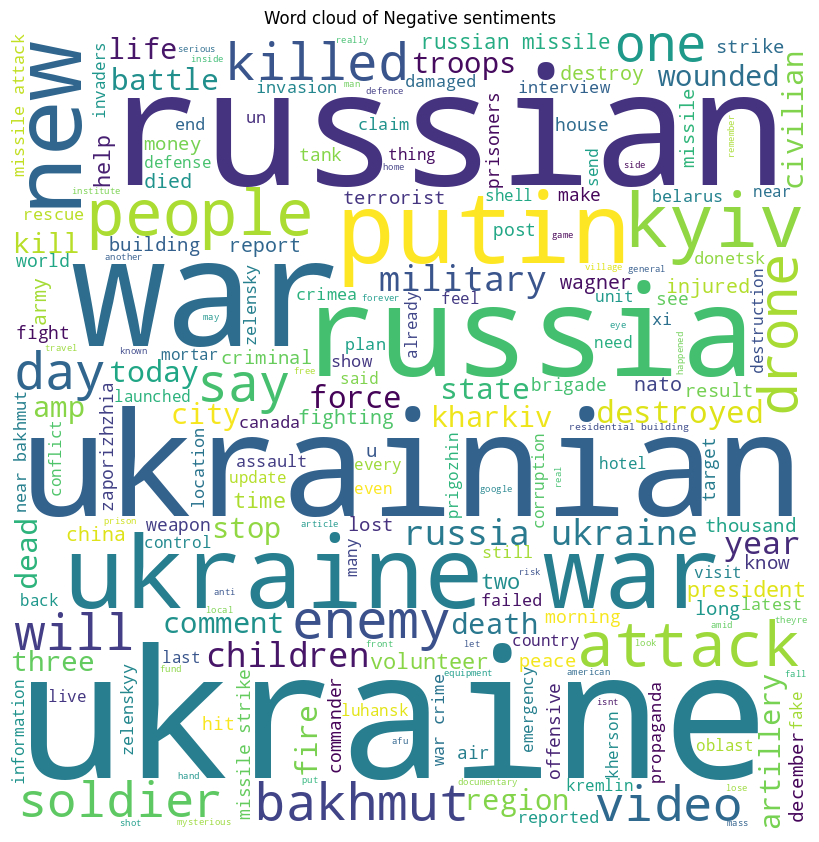

<Figure size 640x480 with 0 Axes>

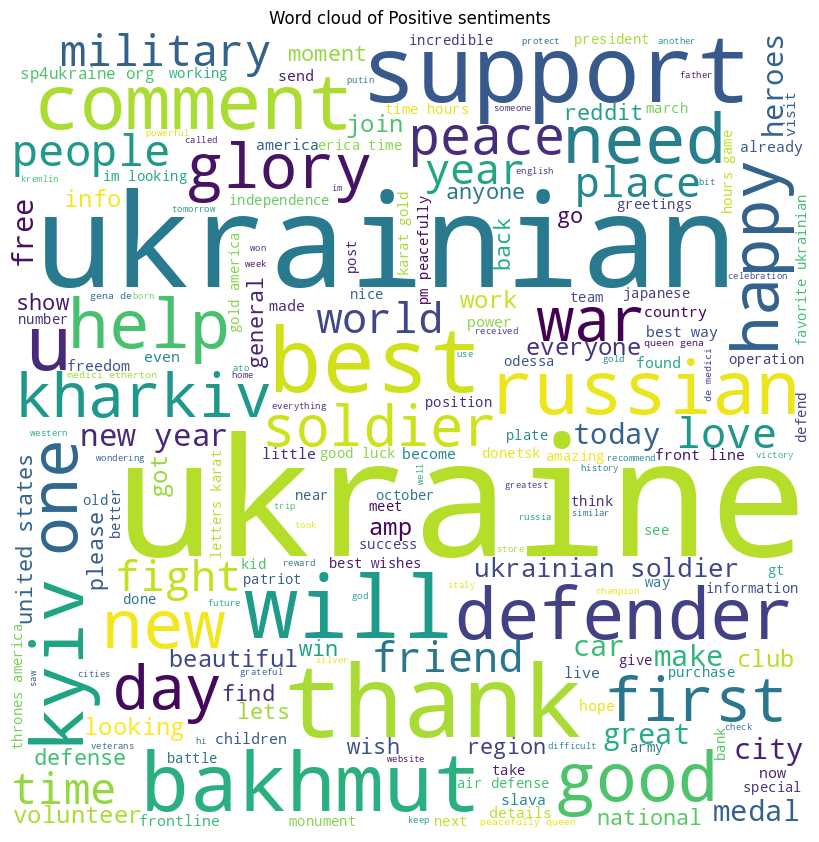

In [ ]:
# Selecting only the rows with negative sentiment
negative_data = r_ukraine[r_ukraine['predicted_values_logreg'] == 0]

# Extracting the text from the 'text' column and joining into a single string
negative_text = " ".join(text for text in negative_data['Title'])

# Generating the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', stopwords=STOPWORDS).generate(negative_text)

# Displaying the word cloud
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title('Word cloud of Negative sentiments')
plt.show()

plt.subplots_adjust(wspace = 0.5)

# Selecting only the rows with positive sentiment
positive_data = r_ukraine[r_ukraine['predicted_values_logreg'] == 1]

# Extracting the text from the 'text' column and joining into a single string
positive_text = " ".join(text for text in positive_data['Title'])

# Generating the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', stopwords=STOPWORDS).generate(positive_text)

# Displaying the word cloud
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title('Word cloud of Positive sentiments')
plt.show()

#### Factor and Topics Identification via Machine Learning

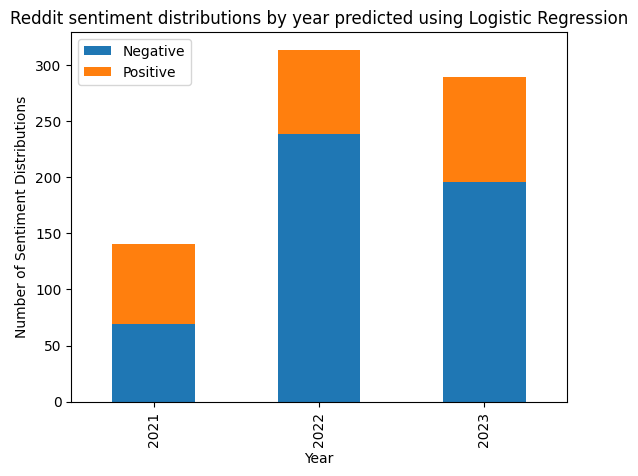

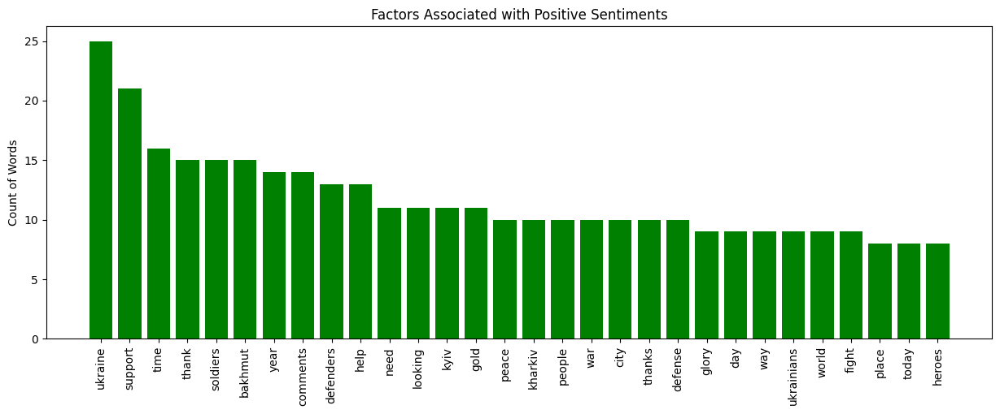

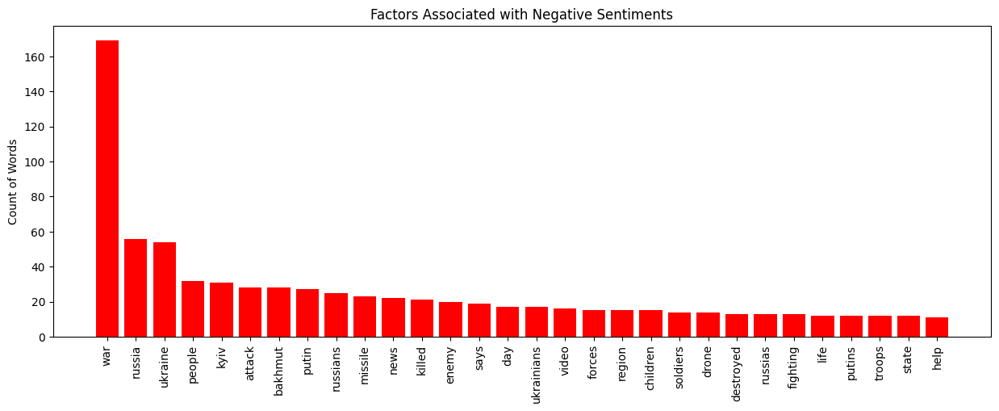

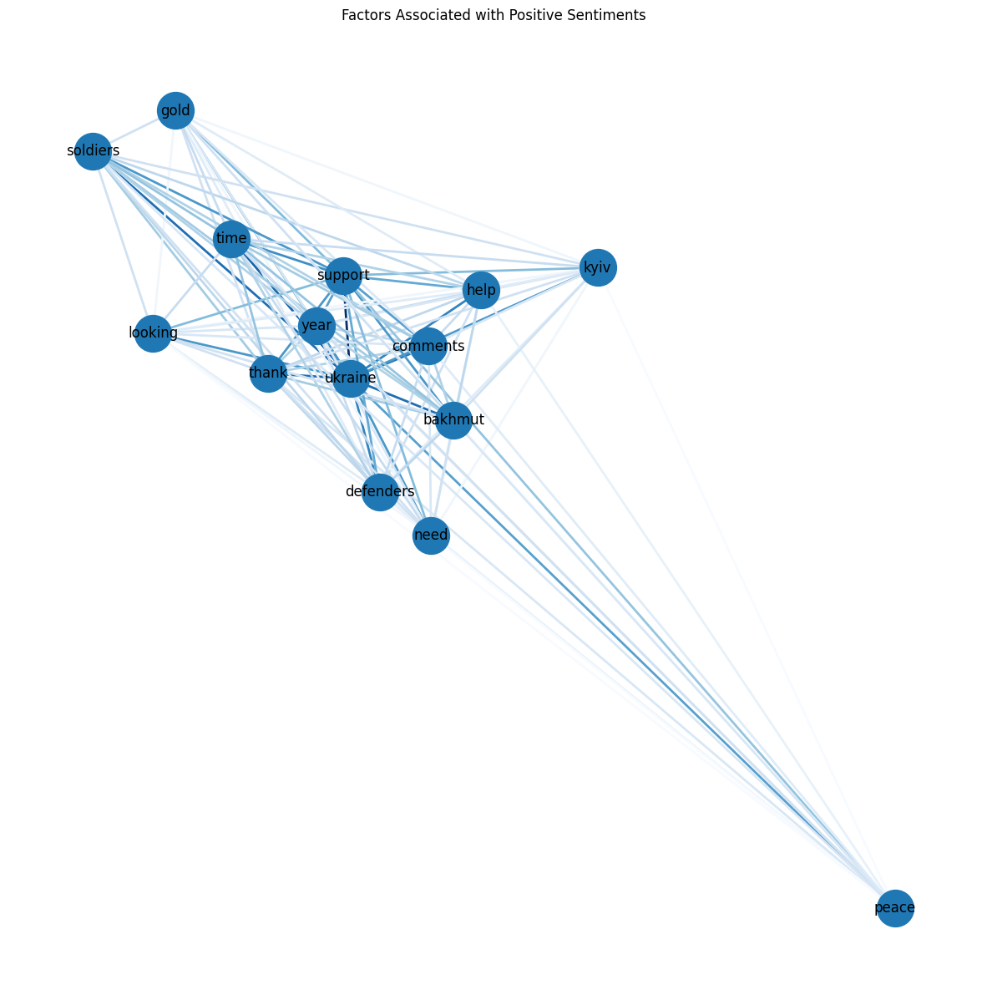

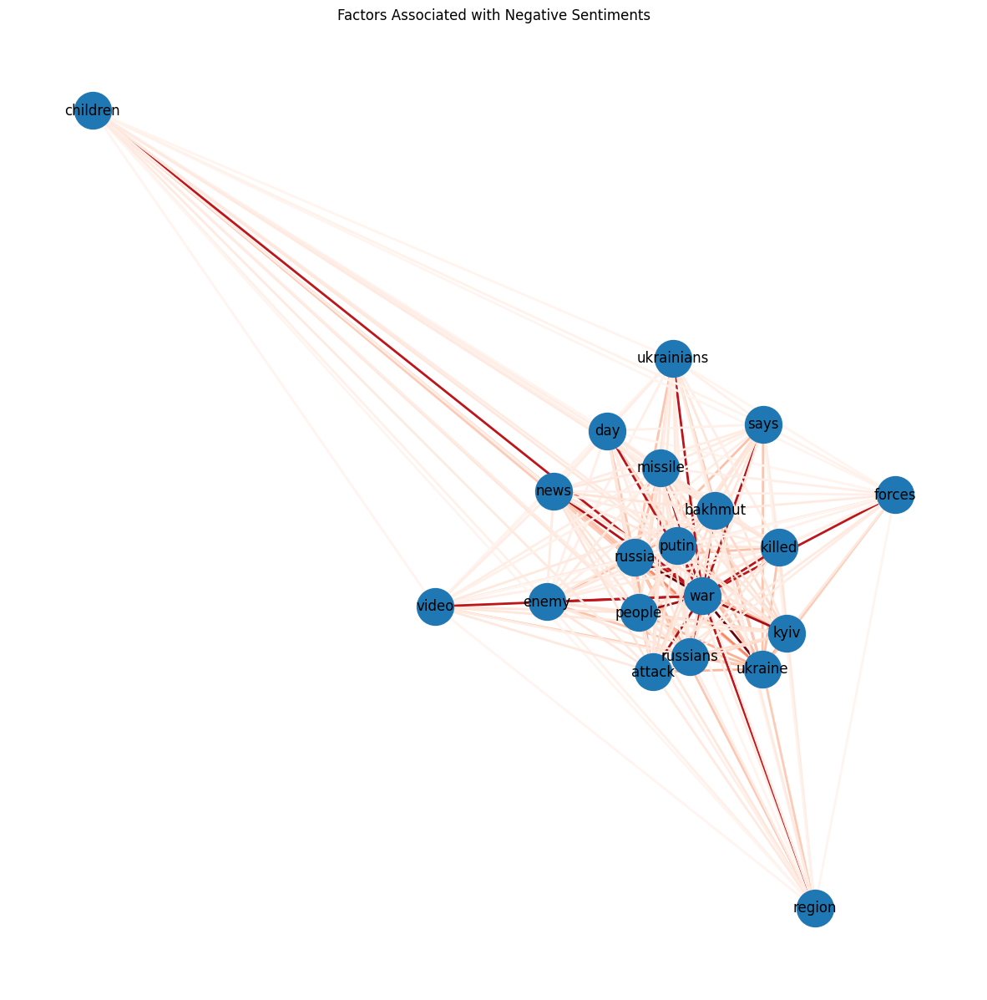

In [ ]:
################################## Reddit sentiment distributions by month and year

from datetime import datetime

def mdy_to_ymd(d):
   return datetime.strptime(d, '%Y-%m-%d').strftime('%Y-%m-%d')

r_ukraine_dates = []
for d in r_ukraine['Publish Date']:
    # soup2.find('time')['datetime'])
    # count2 += 1
    sep = ' '
    stripped = d.split(sep, 1)[0]
    strip_date = mdy_to_ymd(stripped.strip())
    r_ukraine_dates.append(stripped)

r_ukraine['Date'] = r_ukraine_dates
r_ukraine.drop(columns=['Publish Date'], axis=1, inplace=True)
r_ukraine['Date'] =  pd.to_datetime(r_ukraine['Date'], format='%Y-%m-%d')
r_ukraine['Date'] = pd.to_datetime(r_ukraine['Date'])
r_ukraine.set_index('Date', inplace=True)

# Creating new columns for sentiment labels
r_ukraine['Negative'] = (r_ukraine['predicted_values_logreg'] == 0).astype(int)
r_ukraine['Positive'] = (r_ukraine['predicted_values_logreg'] == 1).astype(int)

# Grouping by month and year and aggregate sum of sentiment columns
yearly_sentiment = r_ukraine.groupby([r_ukraine.index.year]).agg({'Negative': 'sum', 'Positive': 'sum'})

# Plotting stacked bar graph
yearly_sentiment.plot(kind='bar', stacked=True)

plt.xlabel('Year')
plt.ylabel('Number of Sentiment Distributions')
plt.title('Reddit sentiment distributions by year predicted using Logistic Regression')
plt.show()

####################################### Unigrams

def extract_factors(text):
  tokens = word_tokenize(text.lower())
  stop_words = set(stopwords.words('english'))
  filtered_tokens = [token for token in tokens if token not in stop_words and token.isalpha()]
  factors = []
  for token, pos in nltk.pos_tag(filtered_tokens):
    if pos.startswith('NN') or pos.startswith('VB'):
      factors.append(token)
  return factors

# Creating a list of factors and their associated sentiments
factors_sentiments = []
for index, row in r_ukraine.iterrows():
  factors = extract_factors(row['Title'])
  for factor in factors:
    factors_sentiments.append((factor, row['predicted_values_logreg']))

# Creating a bar chart of factors associated with positive sentiments
positive_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 1]
positive_counts = Counter(positive_factors).most_common(30)
positive_factors = [x[0] for x in positive_counts]
positive_counts = [x[1] for x in positive_counts]
fig, ax = plt.subplots(figsize=(15, 5))
ax.bar(range(len(positive_counts)), positive_counts, align='center', color='green')
ax.set_xticks(range(len(positive_factors)))
ax.set_xticklabels(positive_factors, rotation='vertical')
ax.set_title('Factors Associated with Positive Sentiments')
ax.set_ylabel(label)
plt.show()

# Creating a bar chart of factors associated with negative sentiments
negative_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 0]
negative_counts = Counter(negative_factors).most_common(30)
negative_factors = [x[0] for x in negative_counts]
negative_counts = [x[1] for x in negative_counts]
fig, ax = plt.subplots(figsize=(15, 5))
ax.bar(range(len(negative_counts)), negative_counts, align='center', color='red')
ax.set_xticks(range(len(negative_factors)))
ax.set_xticklabels(negative_factors, rotation='vertical')
ax.set_title('Factors Associated with Negative Sentiments')
ax.set_ylabel(label)
plt.show()

################################### Network Graphs

random.seed(0)

# Creating a network graph of factors associated with positive sentiments
positive_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 1]
positive_counts = Counter(positive_factors)
positive_top_factors = positive_counts.most_common(15)
positive_top_factors = [factor[0] for factor in positive_top_factors]
positive_graph = nx.DiGraph()
for factor, sentiment in factors_sentiments:
  if factor in positive_top_factors:
    positive_graph.add_node(factor)
for i in range(len(positive_top_factors)):
  for j in range(i+1, len(positive_top_factors)):
    count = 0
    for factor, sentiment in factors_sentiments:
      if factor == positive_top_factors[i] and sentiment == 1:
        count += 1
      elif factor == positive_top_factors[j] and sentiment == 1:
        count += 1
    if count > 0:
      positive_graph.add_edge(positive_top_factors[i], positive_top_factors[j], weight=count)

# Plot the network graph
plt.figure(figsize=(15,15))
pos = nx.spring_layout(positive_graph, k=0.5, seed=0)
nx.draw_networkx_nodes(positive_graph, pos, node_size=1000)
nx.draw_networkx_labels(positive_graph, pos, font_size=12)
edges = positive_graph.edges()
weights = [positive_graph[u][v]['weight'] for u,v in edges]
nx.draw_networkx_edges(positive_graph, pos, edgelist=edges, edge_color=weights, edge_cmap=plt.cm.Blues, edge_vmin=min(weights), edge_vmax=max(weights), arrowsize=10, width=2)
plt.axis('off')
plt.title('Factors Associated with Positive Sentiments')
plt.show()

random.seed(2)

# Creating a network graph of factors associated with negative sentiments
negative_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 0]
negative_counts = Counter(negative_factors)
negative_top_factors = negative_counts.most_common(20)
negative_top_factors = [factor[0] for factor in negative_top_factors]
negative_graph = nx.DiGraph()
for factor, sentiment in factors_sentiments:
  if factor in negative_top_factors:
    negative_graph.add_node(factor)
for i in range(len(negative_top_factors)):
  for j in range(i+1, len(negative_top_factors)):
    count = 0
    for factor, sentiment in factors_sentiments:
      if factor == negative_top_factors[i] and sentiment == 0:
        count += 1
      elif factor == negative_top_factors[j] and sentiment == 0:
        count += 1
    if count > 0:
      negative_graph.add_edge(negative_top_factors[i], negative_top_factors[j], weight=count)

# Plotting the network graph
plt.figure(figsize=(15,15))
pos = nx.spring_layout(negative_graph, k=0.5, seed=2)
nx.draw_networkx_nodes(negative_graph, pos, node_size=1000)
nx.draw_networkx_labels(negative_graph, pos, font_size=12)
edges = negative_graph.edges()
weights = [negative_graph[u][v]['weight'] for u,v in edges]
nx.draw_networkx_edges(negative_graph, pos, edgelist=edges, edge_color=weights, edge_cmap=plt.cm.Reds, edge_vmin=min(weights), edge_vmax=max(weights), arrowsize=10, width=2)
plt.axis('off')
plt.title('Factors Associated with Negative Sentiments')
plt.show()

From the above unigrams, we can see that some of the words like support, thanks, peace and friends are major contributors towards the positive sentiment.</br></br> Similarly, we can see that some of the words like war, attack, missile, enemy, forces, fire and artillery are major contributors towards the negative sentiment.

In the network graph for positive sentiments, words like support Ukraine and support soldiers are strongly related.

The network graph for negative sentiments clearly indicates that every word in the headline is strongly connected to "war". War is in the centre of the cluster and is almost present in every headline making it a negative sentiment.

For Reddit Dataset 2, which consisted of reddit threads, our sentiment classification model achieved an accuracy of 88%. This indicates that the model was able to correctly classify the sentiment of most of the reddit threads. The model classified 10.2% of the reviews as positive, 75.1% as neutral, and 14.7% as negative. The dataset contains data from specific timeperiods in order to see the changing sentiments among the users. We can see that the positive and negative sentiments were equally distributed before the instigation by Russia after which the negative sentiments predominated over the positive sentiments. Data taken after a year from the instigation shows a similar pattern but the negative sentiments seems to have reduced to a certain extent.

#### Visualizations, Storytelling, Recommendations

In [ ]:
################### Bert

umap_model = UMAP(random_state=1122)
bert_topic_model= BERTopic(embedding_model = "all-MiniLM-L6-v2", umap_model=umap_model)

stop_words = set(stopwords.words('english'))
r_ukraine['Title'] = r_ukraine['Title'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words]))

bert_negative = r_ukraine[r_ukraine['predicted_values_logreg']==0]
bert_negative = bert_negative.Title.tolist()
topics, probs = bert_topic_model.fit_transform(bert_negative)

In [ ]:
bert_topic_model.visualize_barchart()

Topic 1:
ukraine, ukrainian, best, happy, kharkiv, defense, thank, place, city, masterpiece
Topic 2:
ukraine, ukrainian, good, support, soldiers, help, fight, thanks, today, russian
Topic 3:
ukraine, best, ukrainian, need, help, amp, way, comments, bakhmut, military
Topic 4:
ukraine, best, ukrainian, new, ukrainians, peace, soldiers, club, slava, power
Topic 5:
america, 24, time, gold, ukraine, defenders, thank, united, support, bakhmut


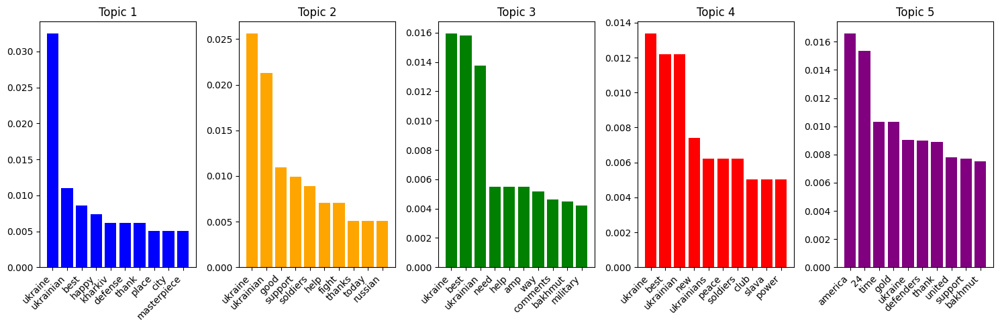

In [ ]:
################# LDA

lda_positive_reddit = r_ukraine[r_ukraine['predicted_values_logreg']==1]

vectorizer = CountVectorizer(stop_words='english')
positive_topics_reddit = vectorizer.fit_transform(lda_positive_reddit['Title'])

# Applying LDA to the document-term matrix
n_topics = 5
lda = LatentDirichletAllocation(n_components=n_topics, random_state=0)
lda.fit(positive_topics_reddit)

# Getting the most representative words or phrases for each topic
feature_names_reddit = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(lda.components_):
    top_words = [feature_names_reddit[i] for i in topic.argsort()[:-10 - 1:-1]]
    print("Topic %d:" % (topic_idx + 1))
    print(", ".join(top_words))

n_words = 10

# Getting the importance of each word in each topic
word_importance_reddit = lda.components_ / lda.components_.sum(axis=1)[:, np.newaxis]

# Defining the colors for each topic
colors = ['blue', 'orange', 'green', 'red', 'purple']

# Create a 1x5 grid of subplots
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(15, 5))

# Flattening the array of subplots so we can iterate over them
axes = axes.flatten()

# Plotting the bar graph for each topic
for i in range(n_topics):
    ax = axes[i]
    ax.bar(np.arange(n_words), word_importance_reddit[i][np.argsort(word_importance_reddit[i])[:-n_words-1:-1]], color=colors[i])
    ax.set_xticks(np.arange(n_words))
    ax.set_xticklabels(np.array(feature_names_reddit)[np.argsort(word_importance_reddit[i])[:-n_words-1:-1]], rotation=45, ha='right')
    ax.set_title("Topic {}".format(i+1))

# Hiding any unused subplots
for i in range(n_topics, len(axes)):
    axes[i].axis('off')

# Adjusting spacing between subplots
fig.tight_layout()

plt.show()

### 2a. Twitter<br>
Dataset 1 - Elon Musk (tw_reply)

In [ ]:
new_data2 = pd.read_csv('/content/tw_reply.csv')

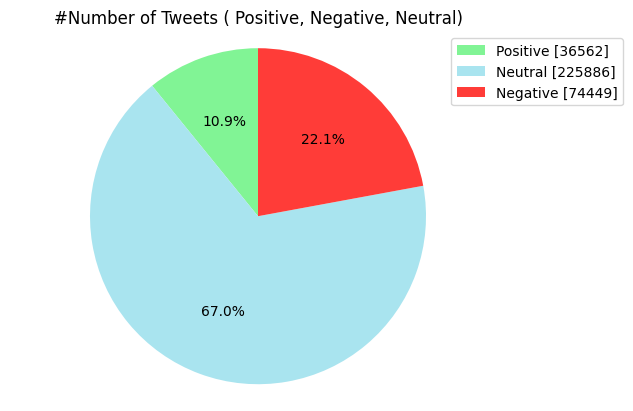

In [ ]:
new_data2.drop(['in_reply_to_tweet_id','retweet_count','reply_count','like_count','created_at'], axis=1, inplace=True)
new_data2 = new_data2.reset_index(drop=True)
new_data2['text'] = new_data2['text'].str.replace('\n', '')
new_data2['text'] = clean_tweets(new_data2['text'])
scores_new_data2 = []

for i in range(new_data2['text'].shape[0]):
  compound = vader_model.polarity_scores(new_data2['text'][i])['compound']
  scores_new_data2.append(compound)

sentiments_score_new_data2 = pd.Series(scores_new_data2)
new_data2['Compound'] = sentiments_score_new_data2

conditions = [
    (new_data2['Compound'] <= -0.5),
    (new_data2['Compound'] > -0.5) & (new_data2['Compound'] < 0.5),
    (new_data2['Compound'] > 0.5)
    ]

# creating a list of the values we want to assign for each condition
values = ['Negative', 'Neutral', 'Positive']

# creating a new column and use np.select to assign values to it using our lists as arguments
new_data2['Category'] = np.select(conditions, values)
new_data2.head()
positive_nd2= len(new_data2[new_data2['Category'] == 'Positive'])
neutral_nd2= len(new_data2[new_data2['Category'] == 'Neutral'])
negative_nd2= len(new_data2[new_data2['Category'] == 'Negative'])

#Creating PieChart
labels = ['Positive ['+str(positive_nd2)+']' , 'Neutral ['+str(neutral_nd2)+']','Negative ['+str(negative_nd2)+']']
sizes = [positive_nd2, neutral_nd2, negative_nd2]
colors = ["#81F495","#A9E4EF","#FF3C38"]
plt.pie(sizes,colors=colors, autopct='%1.1f%%',startangle=90)
plt.style.use('default')
plt.legend(labels, bbox_to_anchor=(1.25, 1.0), loc=1)
plt.title( '#Number of Tweets ( Positive, Negative, Neutral)' )
plt.axis('equal')
plt.show()

In [ ]:
new_data2_upd = new_data2[new_data2['Category'].isin(['Positive','Negative'])]
mapping = {'Positive':1, 'Negative':0}
new_data2_upd['Category'] = new_data2_upd['Category'].map(mapping)
y_actual_new_data2 = new_data2_upd['Category']

In [ ]:
# Making predictions on the test data
y_pred_new_data2 = best_estimator_logistic.predict(new_data2_upd['text'])

print(classification_report(y_actual_new_data2, y_pred_new_data2))
new_data2_upd['Predicted values'] = y_pred_new_data2

              precision    recall  f1-score   support

           0       0.78      0.98      0.87     74449
           1       0.92      0.44      0.59     36562

    accuracy                           0.80    111011
   macro avg       0.85      0.71      0.73    111011
weighted avg       0.83      0.80      0.78    111011



#### Word Cloud for Positive and Negative Sentiments

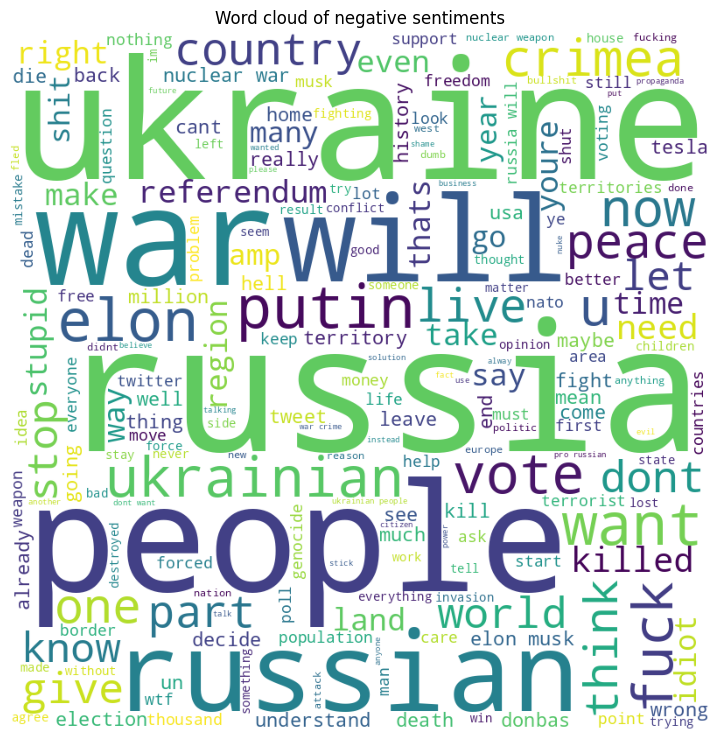

<Figure size 640x480 with 0 Axes>

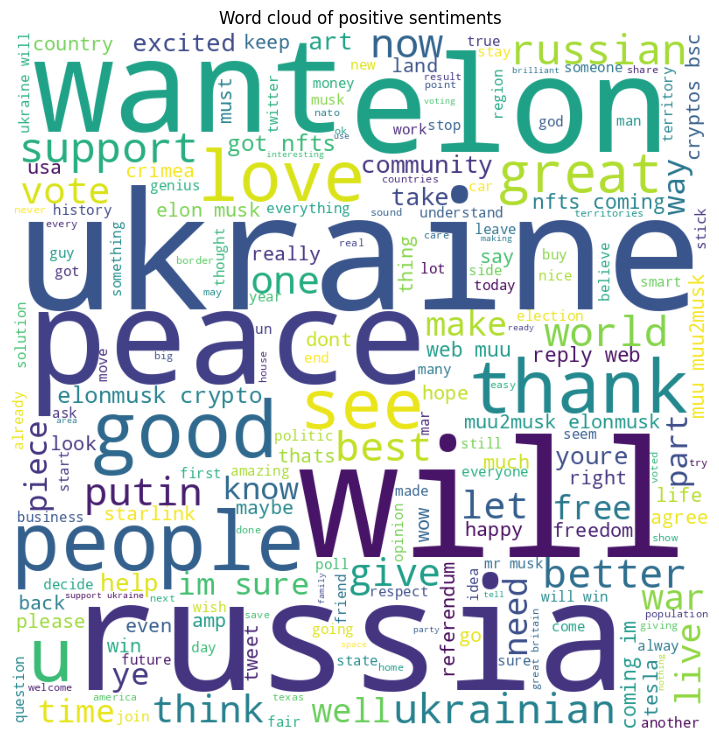

In [ ]:
# Selecting only the rows with negative sentiment
negative_data_newdata2upd = new_data2_upd[new_data2_upd['Predicted values'] == 0]

# Extracting the text from the 'text' column and joining into a single string
negative_text_newdata2upd = " ".join(text for text in negative_data_newdata2upd['text'])

# Generating the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', stopwords=STOPWORDS).generate(negative_text_newdata2upd)

# Displaying the word cloud
plt.figure(figsize=(7, 7), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title('Word cloud of negative sentiments')
plt.show()

plt.subplots_adjust(wspace = 0.5)

# Selecting only the rows with positive sentiment
positive_data_newdata2upd = new_data2_upd[new_data2_upd['Predicted values'] == 1]

# Extracting the text from the 'text' column and joining into a single string
positive_text_newdata2upd = " ".join(text for text in positive_data_newdata2upd['text'])

# Generating the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', stopwords=STOPWORDS).generate(positive_text_newdata2upd)

# Displaying the word cloud
plt.figure(figsize=(7, 7), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title('Word cloud of positive sentiments')
plt.show()

#### Factor and Topics Identification via Machine Learning

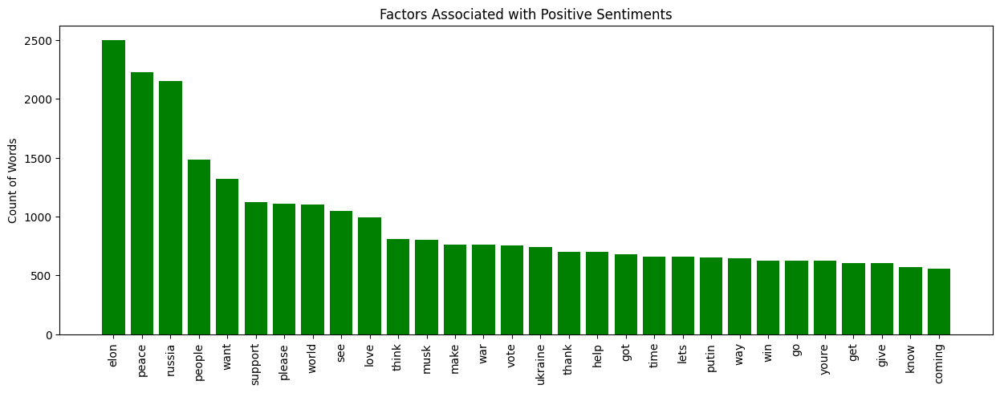

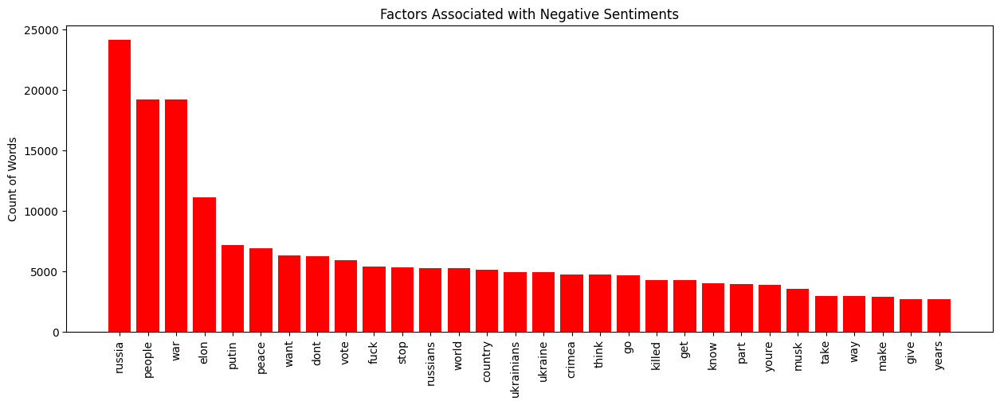

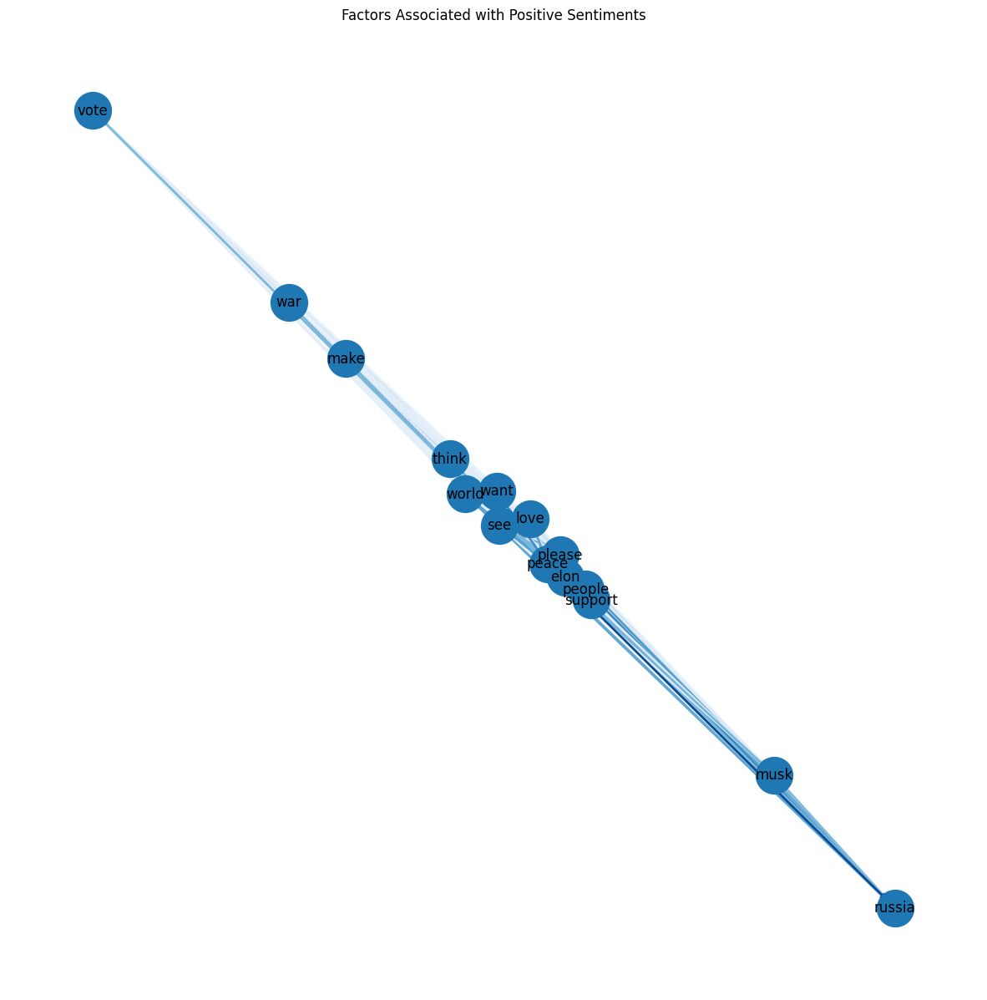

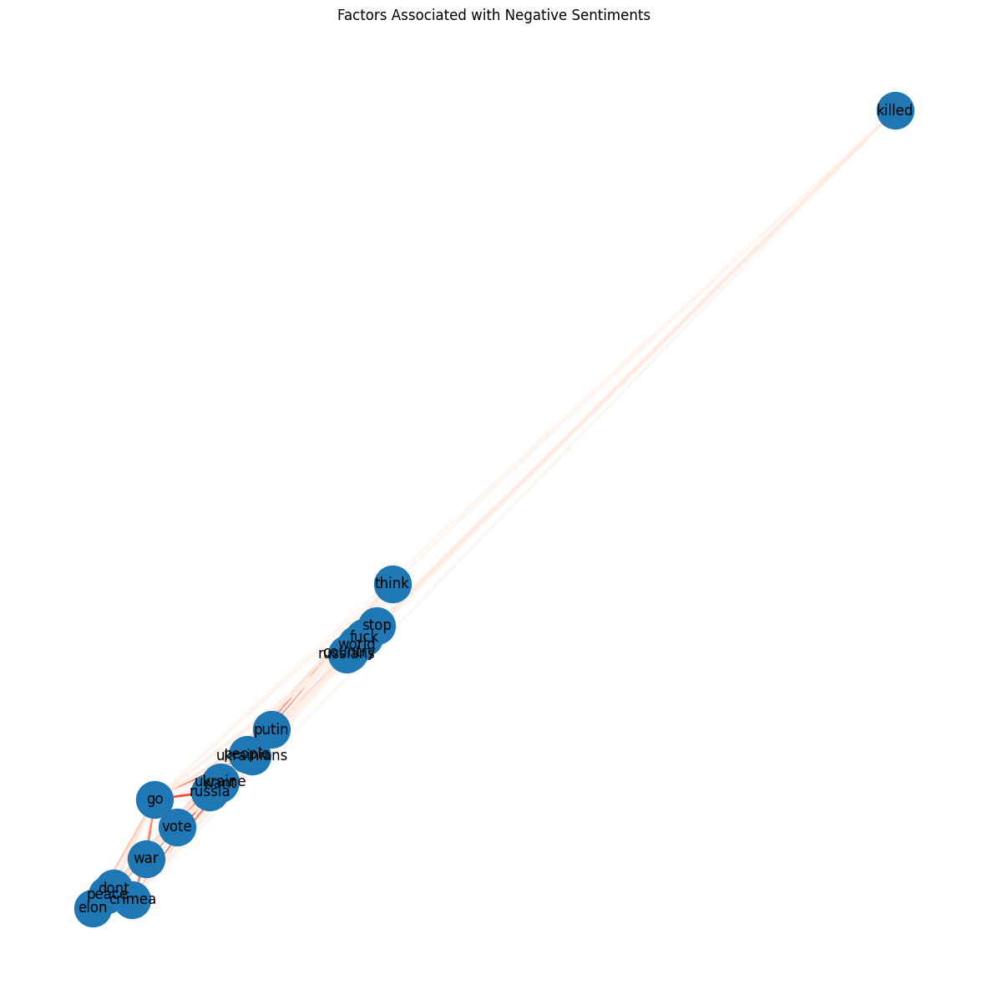

In [ ]:
###################################### Unigrams

def extract_factors(text):
  tokens = word_tokenize(text.lower())
  stop_words = set(stopwords.words('english'))
  filtered_tokens = [token for token in tokens if token not in stop_words and token.isalpha()]
  factors = []
  for token, pos in nltk.pos_tag(filtered_tokens):
    if pos.startswith('NN') or pos.startswith('VB'):
      factors.append(token)
  return factors

# Creating a list of factors and their associated sentiments
factors_sentiments = []
for index, row in new_data2_upd.iterrows():
  factors = extract_factors(row['text'])
  for factor in factors:
    factors_sentiments.append((factor, row['Predicted values']))

# Creating a bar chart of factors associated with positive sentiments
positive_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 1]
positive_counts = Counter(positive_factors).most_common(30)
positive_factors = [x[0] for x in positive_counts]
positive_counts = [x[1] for x in positive_counts]
fig, ax = plt.subplots(figsize=(15, 5))
ax.bar(range(len(positive_counts)), positive_counts, align='center', color='green')
ax.set_xticks(range(len(positive_factors)))
ax.set_xticklabels(positive_factors, rotation='vertical')
ax.set_title('Factors Associated with Positive Sentiments')
ax.set_ylabel(label)
plt.show()

# Creating a bar chart of factors associated with negative sentiments
negative_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 0]
negative_counts = Counter(negative_factors).most_common(30)
negative_factors = [x[0] for x in negative_counts]
negative_counts = [x[1] for x in negative_counts]
fig, ax = plt.subplots(figsize=(15, 5))
ax.bar(range(len(negative_counts)), negative_counts, align='center', color='red')
ax.set_xticks(range(len(negative_factors)))
ax.set_xticklabels(negative_factors, rotation='vertical')
ax.set_title('Factors Associated with Negative Sentiments')
ax.set_ylabel(label)
plt.show()

##################################### Network graphs

random.seed(0)

# Creating a network graph of factors associated with positive sentiments
positive_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 1]
positive_counts = Counter(positive_factors)
positive_top_factors = positive_counts.most_common(15)
positive_top_factors = [factor[0] for factor in positive_top_factors]
positive_graph = nx.DiGraph()
for factor, sentiment in factors_sentiments:
  if factor in positive_top_factors:
    positive_graph.add_node(factor)
for i in range(len(positive_top_factors)):
  for j in range(i+1, len(positive_top_factors)):
    count = 0
    for factor, sentiment in factors_sentiments:
      if factor == positive_top_factors[i] and sentiment == 1:
        count += 1
      elif factor == positive_top_factors[j] and sentiment == 1:
        count += 1
    if count > 0:
      positive_graph.add_edge(positive_top_factors[i], positive_top_factors[j], weight=count)

# Plotting the network graph
plt.figure(figsize=(15,15))
pos = nx.spring_layout(positive_graph, k=0.5, seed=0)
nx.draw_networkx_nodes(positive_graph, pos, node_size=1000)
nx.draw_networkx_labels(positive_graph, pos, font_size=12)
edges = positive_graph.edges()
weights = [positive_graph[u][v]['weight'] for u,v in edges]
nx.draw_networkx_edges(positive_graph, pos, edgelist=edges, edge_color=weights, edge_cmap=plt.cm.Blues, edge_vmin=min(weights), edge_vmax=max(weights), arrowsize=10, width=2)
plt.axis('off')
plt.title('Factors Associated with Positive Sentiments')
plt.show()

random.seed(2)

# Creating a network graph of factors associated with negative sentiments
negative_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 0]
negative_counts = Counter(negative_factors)
negative_top_factors = negative_counts.most_common(20)
negative_top_factors = [factor[0] for factor in negative_top_factors]
negative_graph = nx.DiGraph()
for factor, sentiment in factors_sentiments:
  if factor in negative_top_factors:
    negative_graph.add_node(factor)
for i in range(len(negative_top_factors)):
  for j in range(i+1, len(negative_top_factors)):
    count = 0
    for factor, sentiment in factors_sentiments:
      if factor == negative_top_factors[i] and sentiment == 0:
        count += 1
      elif factor == negative_top_factors[j] and sentiment == 0:
        count += 1
    if count > 0:
      negative_graph.add_edge(negative_top_factors[i], negative_top_factors[j], weight=count)

# Plotting the network graph
plt.figure(figsize=(15,15))
pos = nx.spring_layout(negative_graph, k=0.5, seed=2)
nx.draw_networkx_nodes(negative_graph, pos, node_size=1000)
nx.draw_networkx_labels(negative_graph, pos, font_size=12)
edges = negative_graph.edges()
weights = [negative_graph[u][v]['weight'] for u,v in edges]
nx.draw_networkx_edges(negative_graph, pos, edgelist=edges, edge_color=weights, edge_cmap=plt.cm.Reds, edge_vmin=min(weights), edge_vmax=max(weights), arrowsize=10, width=2)
plt.axis('off')
plt.title('Factors Associated with Negative Sentiments')
plt.show()

From the above unigrams, we can see that some of the words like support, thanks, peace and love are major contributors towards the positive sentiment.</br></br> Similarly, we can see that some of the words like war, fuck, crimea and idiot are major contributors towards the negative sentiment.

In the network graph for postive sentiments, not much information can be extracted since the nodes are connected in a straight line, which means each node is only connected to the node before and after it in the line, and there are no other connections between the nodes.

For Twitter Dataset 1, which consisted of tweets, our sentiment classification model achieved an accuracy of 80%. This indicates that the model was able to correctly classify the sentiment of most of the tweets. The model classified 10.9% of the reviews as positive, 67% as neutral, and 22.1% as negative. We can see that the majority of the tweets had a neutral sentiment. The percentage of positive sentiments were meagre when compared to that of the neutral sentiments. Even though the percentage of negative sentiments were low when compared to that of the neutral sentiments, it had double the count over the positive sentiments among the twitter users due to war's effect.

#### Visualizations, Storytelling, Recommendations

Topic 1:
russian, ukraine, propaganda, wtf, russia, years, ukrainian, history, elon, pro
Topic 2:
elon, youre, idiot, just, stupid, fucking, shit, tesla, dont, like
Topic 3:
fuck, elon, war, ukraine, russia, crimes, musk, die, shut, putin
Topic 4:
russia, ukraine, crimea, people, country, want, referendum, territory, elections, vote
Topic 5:
russia, want, shit, usa, america, evil, nation, hitler, war, dont
Topic 6:
war, nuclear, world, putin, russia, way, weapons, people, think, ukraine
Topic 7:
stupid, elon, mistake, musk, just, alaska, like, hacked, account, did
Topic 8:
ukraine, war, russia, dont, peace, people, putin, fight, russian, care
Topic 9:
stop, ukraine, war, just, peace, wrong, russia, putin, help, elon
Topic 10:
people, vote, killed, russians, ukrainians, russia, russian, live, kill, thousands


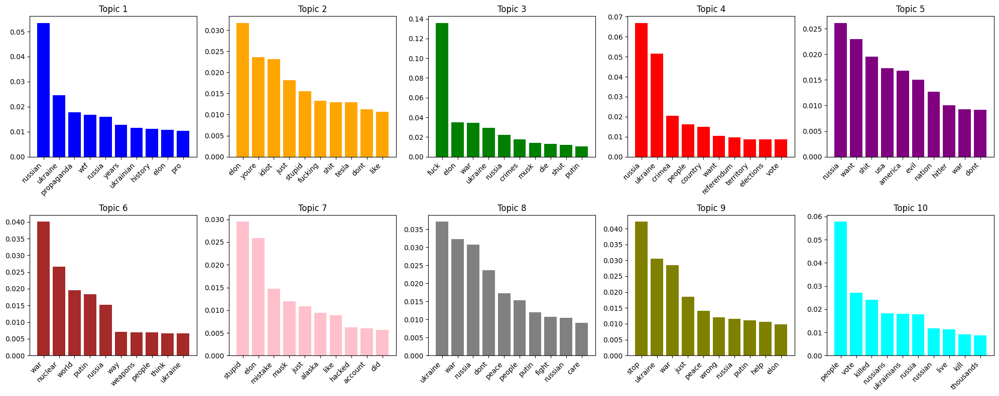

Topic 1:
yes, world, peace, great, just, good, elon, wow, time, need
Topic 2:
elon, good, thank, great, just, youre, better, like, musk, tesla
Topic 3:
ukraine, russia, peace, support, elon, win, war, love, putin, best
Topic 4:
like, vote, people, russia, good, great, think, lets, russian, free
Topic 5:
im, want, sure, got, coming, community, piece, reply, elonmusk, nfts


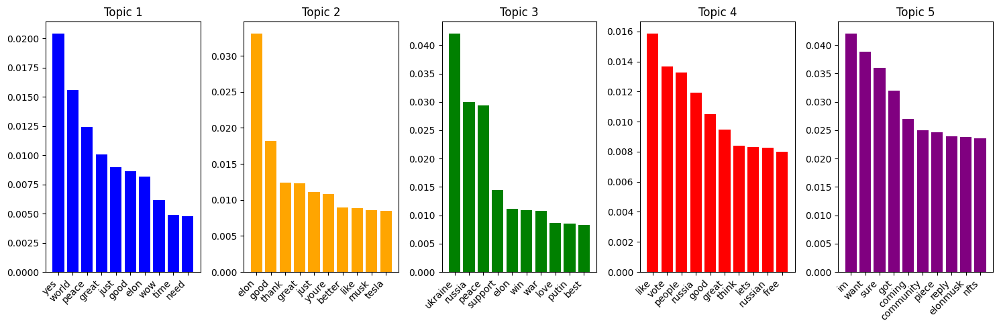

In [ ]:
################################################################################ LDA for negative topic modelling

lda_negative_musk = new_data2_upd[new_data2_upd['Predicted values']==0]

vectorizer = CountVectorizer(stop_words='english')
negative_topics_musk = vectorizer.fit_transform(lda_negative_musk['text'])

# Applying LDA to the document-term matrix
n_topics_neg = 10
lda = LatentDirichletAllocation(n_components=n_topics_neg, random_state=0)
lda.fit(negative_topics_musk)

# Getting the most representative words or phrases for each topic
feature_names_musk = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(lda.components_):
    top_words = [feature_names_musk[i] for i in topic.argsort()[:-10 - 1:-1]]
    print("Topic %d:" % (topic_idx + 1))
    print(", ".join(top_words))

n_words = 10

# Getting the importance of each word in each topic
word_importance_musk = lda.components_ / lda.components_.sum(axis=1)[:, np.newaxis]

# Defining the colors for each topic
colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

# Create a 2x5 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 8))

# Flattening the array of subplots so we can iterate over them
axes = axes.flatten()

# Plotting the bar graph for each topic
for i in range(n_topics_neg):
    ax = axes[i]
    ax.bar(np.arange(n_words), word_importance_musk[i][np.argsort(word_importance_musk[i])[:-n_words-1:-1]], color=colors[i])
    ax.set_xticks(np.arange(n_words))
    ax.set_xticklabels(np.array(feature_names_musk)[np.argsort(word_importance_musk[i])[:-n_words-1:-1]], rotation=45, ha='right')
    ax.set_title("Topic {}".format(i+1))

# Hiding any unused subplots
for i in range(n_topics_neg, len(axes)):
    axes[i].axis('off')

# Adjusting spacing between subplots
fig.tight_layout()

plt.show()

################################################################################  LDA for positive topic modelling

lda_positive_elon = new_data2_upd[new_data2_upd['Predicted values']==1]

vectorizer = CountVectorizer(stop_words='english')
positive_topics_elon = vectorizer.fit_transform(lda_positive_elon['text'])

# Applying LDA to the document-term matrix
n_topics = 5
lda = LatentDirichletAllocation(n_components=n_topics, random_state=0)
lda.fit(positive_topics_elon)

# Getting the most representative words or phrases for each topic
feature_names_elon = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(lda.components_):
    top_words = [feature_names_elon[i] for i in topic.argsort()[:-10 - 1:-1]]
    print("Topic %d:" % (topic_idx + 1))
    print(", ".join(top_words))

n_words = 10

# Getting the importance of each word in each topic
word_importance_elon = lda.components_ / lda.components_.sum(axis=1)[:, np.newaxis]

# Defining the colors for each topic
colors = ['blue', 'orange', 'green', 'red', 'purple']

# Create a 1x5 grid of subplots
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(15, 5))

# Flattening the array of subplots so we can iterate over them
axes = axes.flatten()

# Plotting the bar graph for each topic
for i in range(n_topics):
    ax = axes[i]
    ax.bar(np.arange(n_words), word_importance_elon[i][np.argsort(word_importance_elon[i])[:-n_words-1:-1]], color=colors[i])
    ax.set_xticks(np.arange(n_words))
    ax.set_xticklabels(np.array(feature_names_elon)[np.argsort(word_importance_elon[i])[:-n_words-1:-1]], rotation=45, ha='right')
    ax.set_title("Topic {}".format(i+1))

# Hiding any unused subplots
for i in range(n_topics, len(axes)):
    axes[i].axis('off')

# Adjusting spacing between subplots
fig.tight_layout()

plt.show()

A look at the negative sentiments by LDA suggests that people were not happy with Elon musk's tweet and expressed their disappointment in twitter.

### 2b. Twitter<br>
Dataset 2 - Webscrapped data from Twitter

In [ ]:
tweets_mar_2022 = pd.read_csv('/content/tw_mar_2022.csv')
tweets_oct_2022 = pd.read_csv('/content/tw_oct_2022.csv')
tweets_mar_2023 = pd.read_csv('/content/tw_mar_2023.csv')
tweets_data = pd.concat([tweets_mar_2022, tweets_oct_2022, tweets_mar_2023], ignore_index=True)

In [ ]:
tweets_data['content'] = clean_tweets(tweets_data['content'])
tweets_data['content'].head()

0     really those tax breaks for the rich, the pan...
1    wha matters is identity, self-identity. i imag...
2    ukraine war: us-china talks focus on beijings ...
3     it tells you russia cant invade ukraine witho...
4       you are wrong. un made a report about this ...
Name: content, dtype: object

[nltk_data] Downloading package wordnet to /root/nltk_data...


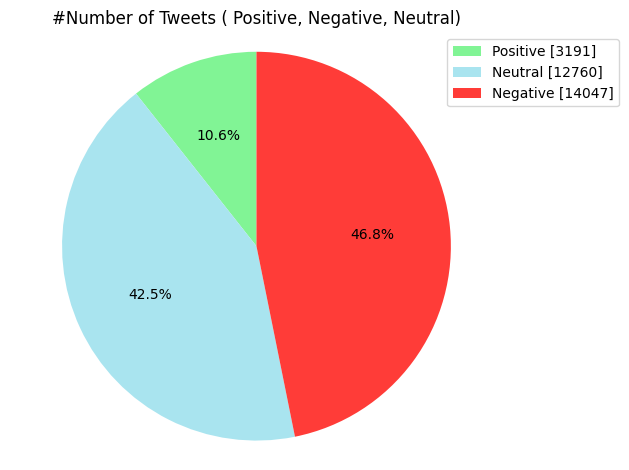

In [ ]:
stopword = stopwords.words('english')

def tokenization(text):
    text = re.split('\W+', text)
    return text

def remove_stopwords(text):
    text = [word for word in text if word not in stopword]
    return text

def lemmatize_sentence(text):
  lmtzr = WordNetLemmatizer()
  text = [lmtzr.lemmatize(word) for word in text]
  return text

# def lemmatize_sentence(text):
#   lemmatizer = WordNetLemmatizer()
#   text = ' '.join([lemmatizer.lemmatize(w) for w in text])
#   return text
# print(lemmatized_output)

def join_sentence(text):
  text = (" ").join(word for word in text)
  return text

from nltk.stem.wordnet import WordNetLemmatizer
nltk.download('wordnet')
tweets_data['text_token'] = tweets_data['content'].apply(lambda x: tokenization(x))
tweets_data['text_stop'] = tweets_data['text_token'].apply(lambda x: remove_stopwords(x))
tweets_data['lemmatized'] = tweets_data['text_stop'].apply(lambda x: lemmatize_sentence(x))
tweets_data['text_joined'] = tweets_data['lemmatized'].apply(lambda x: join_sentence(x))

tweets_data['text_joined'] = tweets_data['text_joined'].str.strip()
tweets_data['content'] = tweets_data['text_joined']
tweets_data.drop(columns=['text_token','text_stop','lemmatized', 'text_joined'], axis=1, inplace=True)

vader_model = SentimentIntensityAnalyzer()
scores = []
# Declare variables for scores
compound_list = []
positive_list = []
negative_list = []
neutral_list = []
for i in range(tweets_data['content'].shape[0]):
#print(analyser.polarity_scores(sentiments_pd['text'][i]))
    compound = vader_model.polarity_scores(tweets_data['content'][i])["compound"]
    pos = vader_model.polarity_scores(tweets_data['content'][i])["pos"]
    neu = vader_model.polarity_scores(tweets_data['content'][i])["neu"]
    neg = vader_model.polarity_scores(tweets_data['content'][i])["neg"]

    scores.append({"Compound": compound,
                       "Positive": pos,
                       "Negative": neg,
                       "Neutral": neu
                  })

sentiments_score = pd.DataFrame.from_dict(scores)
tweets_data = tweets_data.join(sentiments_score)
conditions = [
    (tweets_data['Compound'] <= -0.5),
    (tweets_data['Compound'] > -0.5) & (tweets_data['Compound'] < 0.5),
    (tweets_data['Compound'] > 0.5)
    ]

# create a list of the values we want to assign for each condition
values = ['Negative', 'Neutral', 'Positive']

# create a new column and use np.select to assign values to it using our lists as arguments
tweets_data['Category'] = np.select(conditions, values)
counts = tweets_data['Category'].value_counts()

positive_nd3= len(tweets_data[tweets_data['Category'] == 'Positive'])
neutral_nd3= len(tweets_data[tweets_data['Category'] == 'Neutral'])
negative_nd3= len(tweets_data[tweets_data['Category'] == 'Negative'])

#Creating PieChart
labels = ['Positive ['+str(positive_nd3)+']' , 'Neutral ['+str(neutral_nd3)+']','Negative ['+str(negative_nd3)+']']
sizes = [positive_nd3, neutral_nd3, negative_nd3]
colors = ["#81F495","#A9E4EF","#FF3C38"]
plt.pie(sizes,colors=colors, autopct='%1.1f%%',startangle=90)
plt.style.use('default')
plt.legend(labels, bbox_to_anchor=(1.25, 1.0), loc=1)
plt.title( '#Number of Tweets ( Positive, Negative, Neutral)' )
plt.axis('equal')
plt.tight_layout()
plt.show()

In [ ]:
tweets_data = tweets_data[tweets_data['Category'].isin(['Positive','Negative'])]
mapping = {'Positive':1, 'Negative':0}
tweets_data['Category'] = tweets_data['Category'].map(mapping)
y_actual_tweets = tweets_data['Category']

In [ ]:
y_pred_logreg_tweets = best_estimator_logistic.predict(tweets_data['content'])
print(classification_report(y_actual_tweets, y_pred_logreg_tweets))
tweets_data['predicted_values_logreg'] = y_pred_logreg_tweets
tweets_data.drop(columns=['Positive','Negative','Neutral','Compound'], axis=1, inplace=True)
tweets_data = tweets_data.reset_index(drop=True)

              precision    recall  f1-score   support

           0       0.86      0.99      0.92     14047
           1       0.85      0.29      0.43      3191

    accuracy                           0.86     17238
   macro avg       0.85      0.64      0.67     17238
weighted avg       0.86      0.86      0.83     17238



#### Word Cloud of Positive and Negative Sentiments

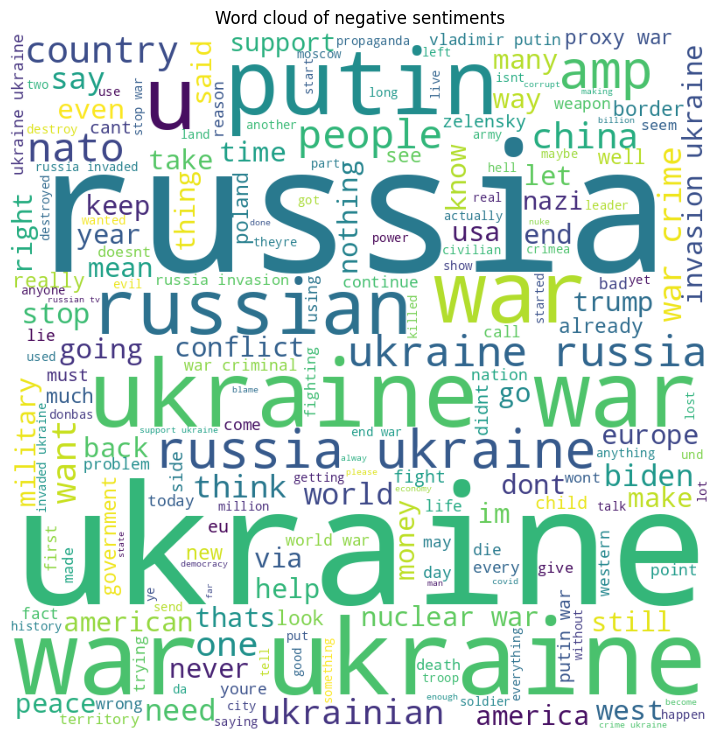

<Figure size 640x480 with 0 Axes>

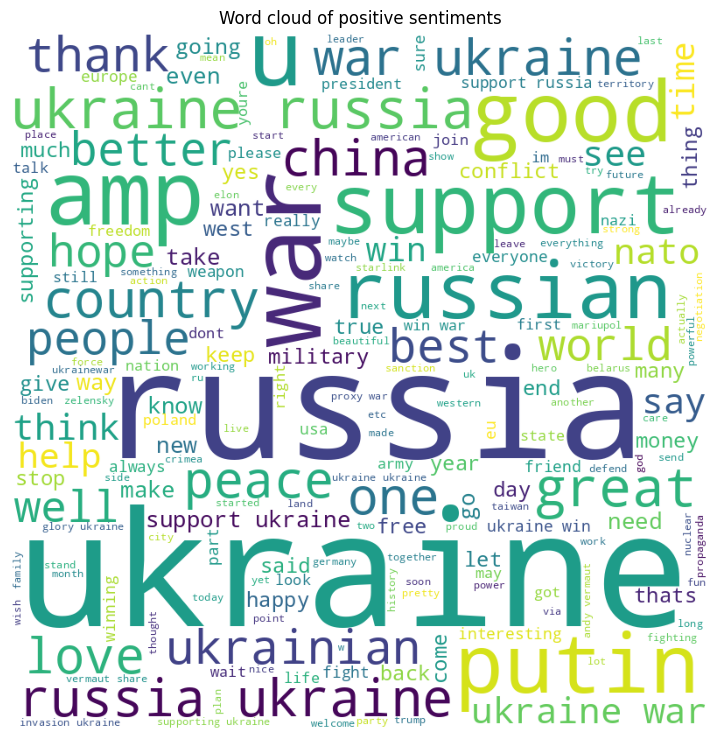

In [ ]:
# Selecting only the rows with negative sentiment
negative_data_tweetsdata = tweets_data[tweets_data['predicted_values_logreg'] == 0]

# Extracting the text from the 'text' column and joining into a single string
negative_text_tweetsdata = " ".join(text for text in negative_data_tweetsdata['content'])

# Generating the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', stopwords=STOPWORDS).generate(negative_text_tweetsdata)

# Display the word cloud
plt.figure(figsize=(7, 7), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title('Word cloud of negative sentiments')
plt.show()

plt.subplots_adjust(wspace = 0.5)

# Selecting only the rows with positive sentiment
positive_data_tweetsdata= tweets_data[tweets_data['predicted_values_logreg'] == 1]

# Extracting the text from the 'text' column and joining into a single string
positive_text_tweetsdata = " ".join(text for text in positive_data_tweetsdata['content'])

# Generating the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', stopwords=STOPWORDS).generate(positive_text_tweetsdata)

# Displaying the word cloud
plt.figure(figsize=(7, 7), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title('Word cloud of positive sentiments')
plt.show()

#### Factor and Topics Identification via Machine Learning

In [ ]:
import datetime

In [ ]:
tweets_data['date'] = pd.to_datetime(tweets_data['date'])
tweets_data.set_index('date', inplace=True)

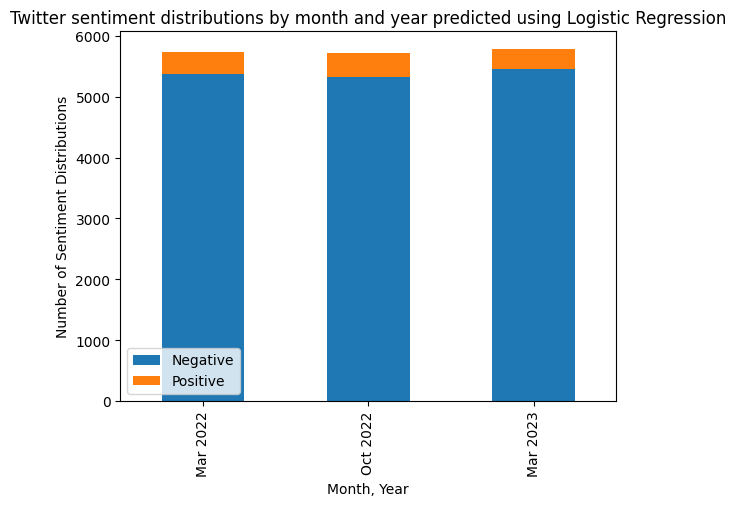

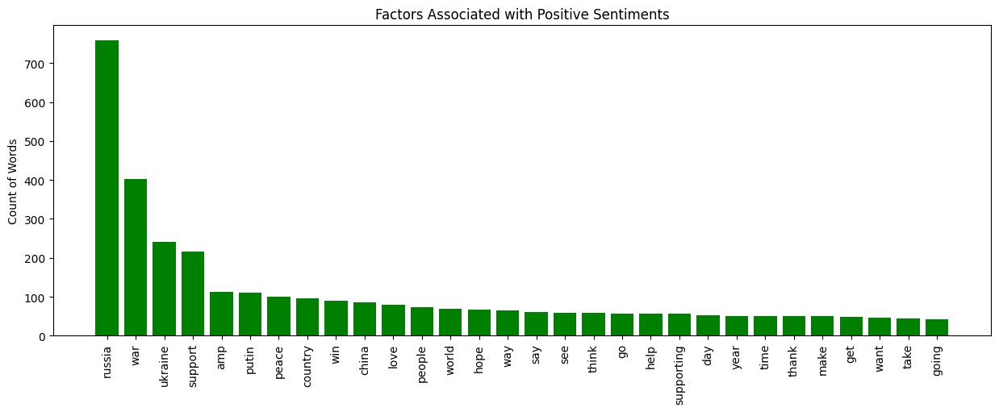

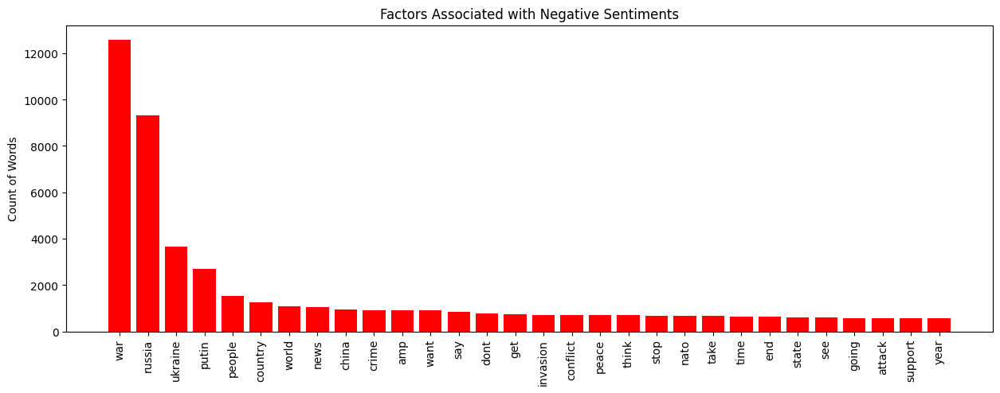

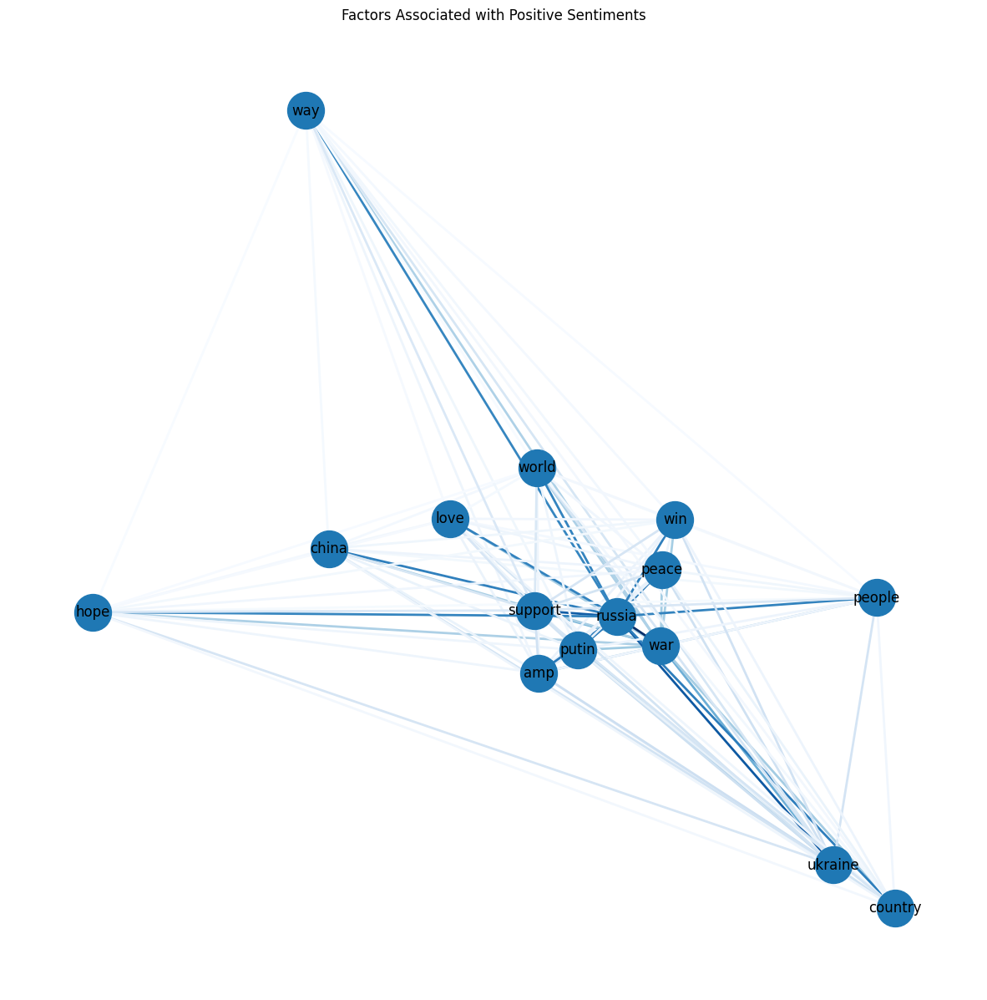

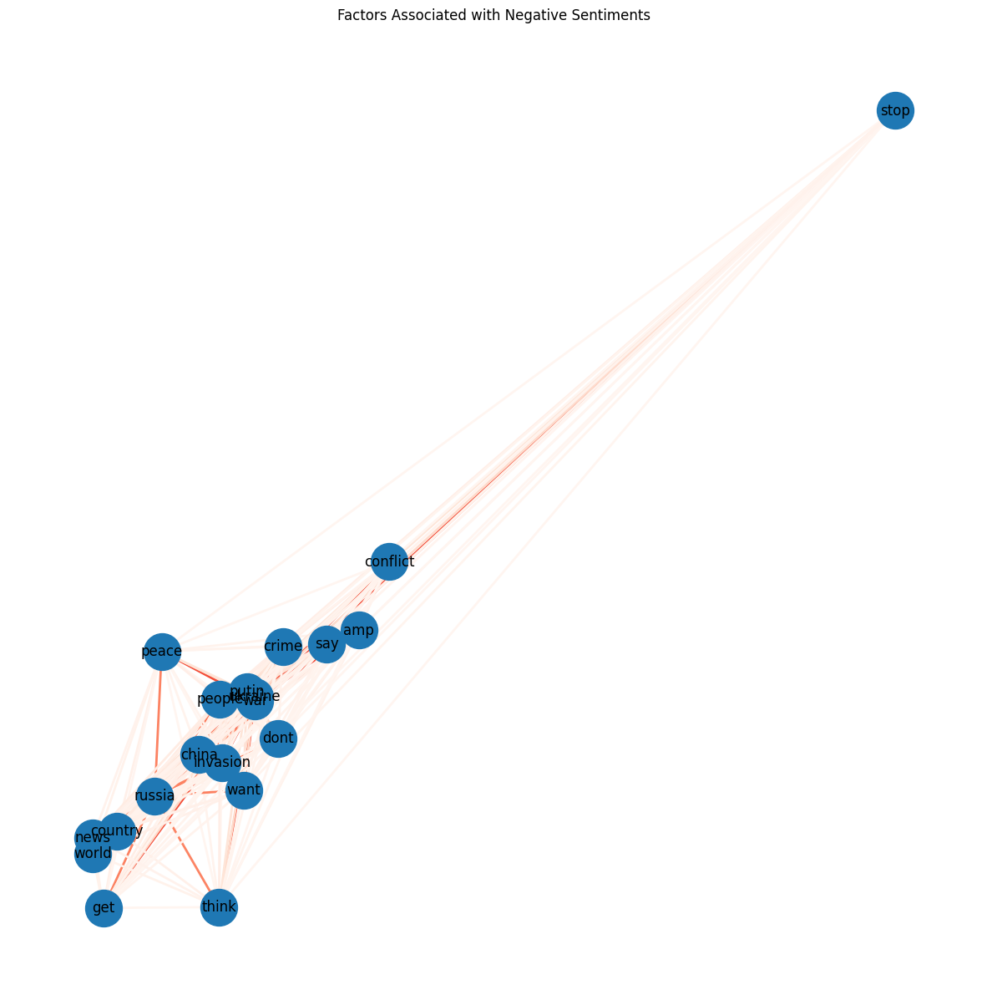

In [ ]:
#################################### Twitter sentiment distributions by month and year

# Creating new columns for sentiment labels
tweets_data['Negative'] = (tweets_data['predicted_values_logreg'] == 0).astype(int)
tweets_data['Positive'] = (tweets_data['predicted_values_logreg'] == 1).astype(int)

# Grouping by month and year and aggregating sum of sentiment columns
monthly_sentiment = tweets_data.groupby([tweets_data.index.year, tweets_data.index.month]).agg({'Negative': 'sum', 'Positive': 'sum'})

# Plotting stacked bar graph
monthly_sentiment.plot(kind='bar', stacked=True)

# Modifying x-axis to display month and year labels
labels = [datetime.datetime(year=x[0], month=x[1], day=1) for x in monthly_sentiment.index]
labels = [x.strftime('%b %Y') for x in labels]
plt.xticks(range(len(labels)), labels)

plt.xlabel('Month, Year')
plt.ylabel('Number of Sentiment Distributions')
plt.title('Twitter sentiment distributions by month and year predicted using Logistic Regression')

###################################### Unigrams

def extract_factors(text):
  tokens = word_tokenize(text.lower())
  stop_words = set(stopwords.words('english'))
  filtered_tokens = [token for token in tokens if token not in stop_words and token.isalpha()]
  factors = []
  for token, pos in nltk.pos_tag(filtered_tokens):
    if pos.startswith('NN') or pos.startswith('VB'):
      factors.append(token)
  return factors

# Creating a list of factors and their associated sentiments
factors_sentiments = []
for index, row in tweets_data.iterrows():
  factors = extract_factors(row['content'])
  for factor in factors:
    factors_sentiments.append((factor, row['predicted_values_logreg']))

# Creating a bar chart of factors associated with positive sentiments
positive_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 1]
positive_counts = Counter(positive_factors).most_common(30)
positive_factors = [x[0] for x in positive_counts]
positive_counts = [x[1] for x in positive_counts]
fig, ax = plt.subplots(figsize=(15, 5))
ax.bar(range(len(positive_counts)), positive_counts, align='center', color='green')
ax.set_xticks(range(len(positive_factors)))
ax.set_xticklabels(positive_factors, rotation='vertical')
ax.set_title('Factors Associated with Positive Sentiments')
ax.set_ylabel(label)
plt.show()

# Creating a bar chart of factors associated with negative sentiments
negative_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 0]
negative_counts = Counter(negative_factors).most_common(30)
negative_factors = [x[0] for x in negative_counts]
negative_counts = [x[1] for x in negative_counts]
fig, ax = plt.subplots(figsize=(15, 5))
ax.bar(range(len(negative_counts)), negative_counts, align='center', color='red')
ax.set_xticks(range(len(negative_factors)))
ax.set_xticklabels(negative_factors, rotation='vertical')
ax.set_title('Factors Associated with Negative Sentiments')
ax.set_ylabel(label)
plt.show()

###################################### Network graph

random.seed(0)

# Creating a network graph of factors associated with positive sentiments
positive_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 1]
positive_counts = Counter(positive_factors)
positive_top_factors = positive_counts.most_common(15)
positive_top_factors = [factor[0] for factor in positive_top_factors]
positive_graph = nx.DiGraph()
for factor, sentiment in factors_sentiments:
  if factor in positive_top_factors:
    positive_graph.add_node(factor)
for i in range(len(positive_top_factors)):
  for j in range(i+1, len(positive_top_factors)):
    count = 0
    for factor, sentiment in factors_sentiments:
      if factor == positive_top_factors[i] and sentiment == 1:
        count += 1
      elif factor == positive_top_factors[j] and sentiment == 1:
        count += 1
    if count > 0:
      positive_graph.add_edge(positive_top_factors[i], positive_top_factors[j], weight=count)

# Plotting the network graph
plt.figure(figsize=(15,15))
pos = nx.spring_layout(positive_graph, k=0.5, seed=0)
nx.draw_networkx_nodes(positive_graph, pos, node_size=1000)
nx.draw_networkx_labels(positive_graph, pos, font_size=12)
edges = positive_graph.edges()
weights = [positive_graph[u][v]['weight'] for u,v in edges]
nx.draw_networkx_edges(positive_graph, pos, edgelist=edges, edge_color=weights, edge_cmap=plt.cm.Blues, edge_vmin=min(weights), edge_vmax=max(weights), arrowsize=10, width=2)
plt.axis('off')
plt.title('Factors Associated with Positive Sentiments')
plt.show()

random.seed(2)

# Creating a network graph of factors associated with negative sentiments
negative_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 0]
negative_counts = Counter(negative_factors)
negative_top_factors = negative_counts.most_common(20)
negative_top_factors = [factor[0] for factor in negative_top_factors]
negative_graph = nx.DiGraph()
for factor, sentiment in factors_sentiments:
  if factor in negative_top_factors:
    negative_graph.add_node(factor)
for i in range(len(negative_top_factors)):
  for j in range(i+1, len(negative_top_factors)):
    count = 0
    for factor, sentiment in factors_sentiments:
      if factor == negative_top_factors[i] and sentiment == 0:
        count += 1
      elif factor == negative_top_factors[j] and sentiment == 0:
        count += 1
    if count > 0:
      negative_graph.add_edge(negative_top_factors[i], negative_top_factors[j], weight=count)

# Plotting the network graph
plt.figure(figsize=(15,15))
pos = nx.spring_layout(negative_graph, k=0.5, seed=2)
nx.draw_networkx_nodes(negative_graph, pos, node_size=1000)
nx.draw_networkx_labels(negative_graph, pos, font_size=12)
edges = negative_graph.edges()
weights = [negative_graph[u][v]['weight'] for u,v in edges]
nx.draw_networkx_edges(negative_graph, pos, edgelist=edges, edge_color=weights, edge_cmap=plt.cm.Reds, edge_vmin=min(weights), edge_vmax=max(weights), arrowsize=10, width=2)
plt.axis('off')
plt.title('Factors Associated with Negative Sentiments')
plt.show()

From the above unigrams, we can see that some of the words like support, thanks, peace and hope are major contributors towards the positive sentiment.</br></br> Similarly, we can see that some of the words like war, attack, invasion, crime, force and weapon are major contributors towards the negative sentiment.

The negative sentiments of network graph form one big cluster with nodes close to each other. This indicates that these words appeared frequently in the headlines.

For Twitter Dataset 2, which consisted of tweets, our sentiment classification model achieved an accuracy of 86%. This indicates that the model was able to correctly classify the sentiment of most of the tweets. The model classified 10.6% of the reviews as positive, 42.5% as neutral, and 46.9% as negative. The dataset contains data from specific timeperiods in order to see the changing sentiments among the users. The timeperiods taken here for consideration were right after the instigation by Russia, 6 months after instigation and 1 year after the instigation. We can see that the negative sentiments predominated over the positive sentiments and neutral sentiments due to the effect of war.  The percentage of positive sentiments were meagre thus showcasing the sentiments among the twitter users after war convened.

#### Visualizations, Storytelling, Recommendations

In [ ]:
umap_model = UMAP(random_state=1122)
bert_topic_model= BERTopic(embedding_model = "all-MiniLM-L6-v2", umap_model=umap_model)

stop_words = set(stopwords.words('english'))
tweets_data['content'] = tweets_data['content'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words]))

bert_negative = tweets_data[tweets_data['predicted_values_logreg']==0]
bert_negative = bert_negative.content.tolist()
topics, probs = bert_topic_model.fit_transform(bert_negative)

In [ ]:
bert_topic_model.visualize_barchart()

Summary:<br>
The use of words such as nuclear, nuke causes concern. Nato countries are supporting Ukraine's stance on joining their federation. This increases the support for Ukraine and improve its image internationally.

Topic 1:
ukraine, russia, nato, putin, war, peace, country, china, people, want
Topic 2:
russia, ukraine, china, peace, like, support, russian, want, think, dont
Topic 3:
ukraine, russia, putin, war, russian, country, nato, amp, like, ukrainian
Topic 4:
ukraine, russia, war, peace, like, putin, russian, people, support, country
Topic 5:
ukraine, russia, putin, war, amp, freedom, support, russian, love, peace


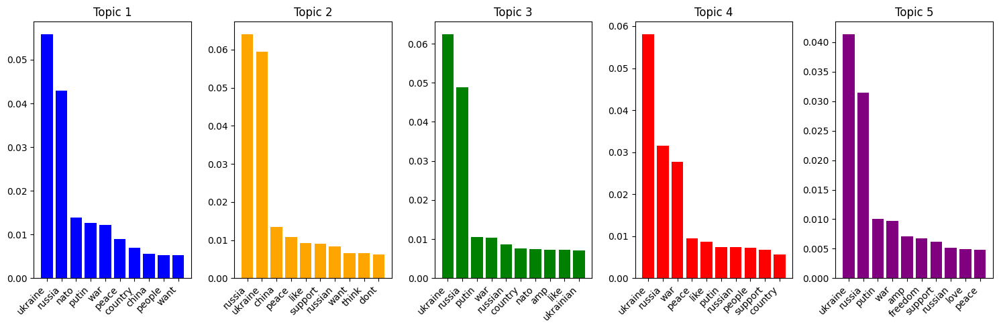

In [ ]:
###################################### LDA

lda_positive_twit = tweets_data[tweets_data['Category']==1]

vectorizer = CountVectorizer(stop_words='english')
positive_topics_twit = vectorizer.fit_transform(lda_positive_twit['content'])

# Applying LDA to the document-term matrix
n_topics = 5
lda = LatentDirichletAllocation(n_components=n_topics, random_state=0)
lda.fit(positive_topics_twit)

# Getting the most representative words or phrases for each topic
feature_names_twit = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(lda.components_):
    top_words = [feature_names_twit[i] for i in topic.argsort()[:-10 - 1:-1]]
    print("Topic %d:" % (topic_idx + 1))
    print(", ".join(top_words))

n_words = 10

# Getting the importance of each word in each topic
word_importance_twit = lda.components_ / lda.components_.sum(axis=1)[:, np.newaxis]

# Defining the colors for each topic
colors = ['blue', 'orange', 'green', 'red', 'purple']

# Creating a 1x5 grid of subplots
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(15, 5))

# Flattening the array of subplots so we can iterate over them
axes = axes.flatten()

# Plotting the bar graph for each topic
for i in range(n_topics):
    ax = axes[i]
    ax.bar(np.arange(n_words), word_importance_twit[i][np.argsort(word_importance_twit[i])[:-n_words-1:-1]], color=colors[i])
    ax.set_xticks(np.arange(n_words))
    ax.set_xticklabels(np.array(feature_names_twit)[np.argsort(word_importance_twit[i])[:-n_words-1:-1]], rotation=45, ha='right')
    ax.set_title("Topic {}".format(i+1))

# Hiding any unused subplots
for i in range(n_topics, len(axes)):
    axes[i].axis('off')

# Adjusting spacing between subplots
fig.tight_layout()

plt.show()

### 2c. Twitter<br>
Dataset 3 - Public sentiments from Aug 2022 to March 2023

In [ ]:
new_data3_aug = pd.read_csv('0819_UkraineCombinedTweetsDeduped.csv')
new_data3_dec = pd.read_csv('1219_UkraineCombinedTweetsDeduped.csv')
new_data3_mar = pd.read_csv('20230319_UkraineCombinedTweetsDeduped.csv')

# only keep the tweet text, language of the tweet, and whether its reweet

new_data3_aug = new_data3_aug.loc[:,['text', 'language','is_retweet']]
new_data3_dec = new_data3_dec.loc[:,['text', 'language','is_retweet']]
new_data3_mar = new_data3_mar.loc[:,['text', 'language','is_retweet']]

# drop all rows that is reweet or not in english

new_data3_aug = new_data3_aug.loc[~((new_data3_aug['language'] != 'en') | (new_data3_aug['is_retweet'] == True)), :]
new_data3_dec = new_data3_dec.loc[~((new_data3_dec['language'] != 'en') | (new_data3_dec['is_retweet'] == True)), :]
new_data3_mar = new_data3_mar.loc[~((new_data3_mar['language'] != 'en') | (new_data3_mar['is_retweet'] == True)), :]


In [ ]:
#cleaning the tweets
def remove_pattern(input_txt, pattern):
    r = re.findall(pattern, input_txt)
    for i in r:
        input_txt = re.sub(i, '', input_txt)
    return input_txt
def clean_tweet(tweets):
    tweets = np.vectorize(remove_pattern)(tweets, "RT @[\w]*:")
    tweets = np.vectorize(remove_pattern)(tweets, "@[\w]*")
    tweets = np.vectorize(remove_pattern)(tweets, "https?://[A-Za-z0-9./]*")
    tweets = np.core.defchararray.replace(tweets, "[^a-zA-Z]", " ")

    return tweets

new_data3_aug['text'] = clean_tweet(new_data3_aug['text'])
new_data3_aug['text'] = new_data3_aug['text'].str.replace('\n', '')
new_data3_aug = new_data3_aug.reset_index(drop=True)

new_data3_dec['text'] = clean_tweet(new_data3_dec['text'])
new_data3_dec['text'] = new_data3_dec['text'].str.replace('\n', '')
new_data3_dec = new_data3_dec.reset_index(drop=True)

new_data3_mar['text'] = clean_tweet(new_data3_mar['text'])
new_data3_mar['text'] = new_data3_mar['text'].str.replace('\n', '')
new_data3_mar = new_data3_mar.reset_index(drop=True)

In [ ]:
vader_model = SentimentIntensityAnalyzer()
scores_new_data3_aug = []

################################################# August 2022

for i in range(new_data3_aug['text'].shape[0]):

    compound = vader_model.polarity_scores(new_data3_aug['text'][i])['compound']
    scores_new_data3_aug.append(compound)

sentiments_score_new_data3_aug = pd.Series(scores_new_data3_aug)
new_data3_aug['Compound'] = sentiments_score_new_data3_aug

conditions = [
    (new_data3_aug['Compound'] <= -0.5),
    (new_data3_aug['Compound'] > -0.5) & (new_data3_aug['Compound'] < 0.5),
    (new_data3_aug['Compound'] > 0.5)
    ]

# create a list of the values we want to assign for each condition
values = ['Negative', 'Neutral', 'Positive']

# create a new column and use np.select to assign values to it using our lists as arguments
new_data3_aug['Category'] = np.select(conditions, values)

################################################## December 2022

scores_new_data3_dec = []

for i in range(new_data3_dec['text'].shape[0]):

    compound = vader_model.polarity_scores(new_data3_dec['text'][i])['compound']
    scores_new_data3_dec.append(compound)

sentiments_score_new_data3_dec = pd.Series(scores_new_data3_dec)
new_data3_dec['Compound'] = sentiments_score_new_data3_dec

# define conditions
conditions = [
    (new_data3_dec['Compound'] <= -0.5),
    (new_data3_dec['Compound'] > -0.5) & (new_data3_dec['Compound'] < 0.5),
    (new_data3_dec['Compound'] > 0.5)
]

# create a list of the values we want to assign for each condition
values = ['Negative', 'Neutral', 'Positive']

# create a new column and use np.select to assign values to it using our lists as arguments
new_data3_dec['Category'] = np.select(conditions, values)

################################################ March 2023

scores_new_data3_mar = []

for i in range(new_data3_mar['text'].shape[0]):
    compound = vader_model.polarity_scores(new_data3_mar['text'][i])['compound']
    scores_new_data3_mar.append(compound)

sentiments_score_new_data3_mar = pd.Series(scores_new_data3_mar)
new_data3_mar['Compound'] = sentiments_score_new_data3_mar

# define conditions
conditions = [
    (new_data3_mar['Compound'] <= -0.5),
    (new_data3_mar['Compound'] > -0.5) & (new_data3_mar['Compound'] < 0.5),
    (new_data3_mar['Compound'] > 0.5)
]

# create a list of the values we want to assign for each condition
values = ['Negative', 'Neutral', 'Positive']

# create a new column and use np.select to assign values to it using our lists as arguments
new_data3_mar['Category'] = np.select(conditions, values)

#### How twitter sentiments changed over time

In [ ]:
def sentiment_count(df):
    non_neutral_df = df[df['Category'] != 'Neutral']
    sentiment_counts = non_neutral_df['Category'].value_counts()
    positive_ratio = sentiment_counts['Positive'] / sentiment_counts.sum()
    return sentiment_counts, positive_ratio

In [ ]:
aug_counts, aug_positive_ratio = sentiment_count(new_data3_aug)
dec_counts, dec_positive_ratio = sentiment_count(new_data3_dec)
mar_counts, mar_positive_ratio = sentiment_count(new_data3_mar)

In [ ]:
print("August Sentiment Counts:\n", aug_counts)
print("December Sentiment Counts:\n", dec_counts)
print("March Sentiment Counts:\n", mar_counts)

print("\nAugust Positive Sentiment Ratio:", aug_positive_ratio)
print("December Positive Sentiment Ratio:", dec_positive_ratio)
print("March Positive Sentiment Ratio:", mar_positive_ratio)

August Sentiment Counts:
 Negative    4830
Positive    3995
Name: Category, dtype: int64
December Sentiment Counts:
 Negative    5519
Positive    3588
0              1
Name: Category, dtype: int64
March Sentiment Counts:
 Negative    7053
Positive    4034
Name: Category, dtype: int64

August Positive Sentiment Ratio: 0.4526912181303116
December Positive Sentiment Ratio: 0.3939393939393939
March Positive Sentiment Ratio: 0.3638495535311626


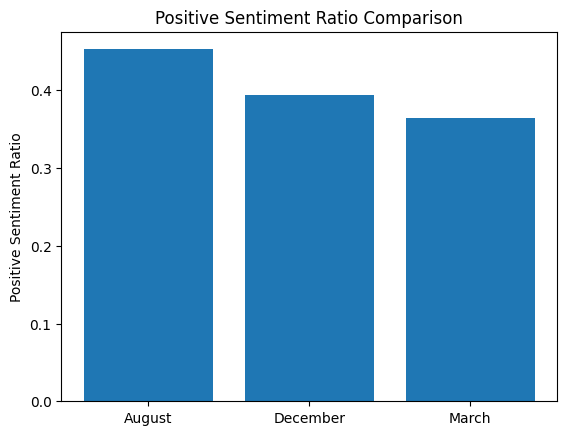

In [ ]:
def plot_positive_ratios(aug, dec, mar):
    months = ['August', 'December', 'March']
    ratios = [aug, dec, mar]

    plt.bar(months, ratios)
    plt.ylabel('Positive Sentiment Ratio')
    plt.title('Positive Sentiment Ratio Comparison')
    plt.show()

plot_positive_ratios(aug_positive_ratio, dec_positive_ratio, mar_positive_ratio)

The public sentiment ratio was calculated by analyzing tweets for every month, and as a whole from the above plot, we can infer that the percentage of postive tweets pertaining to the on-going war has reduced from August 2022 to March 2023.

### 3a. News<br>
a) Dataset 1 - CNN News

Web Scrapping Code

In [ ]:
#from bs4 import BeautifulSoup as soup
#import requests
#from datetime import timedelta, date


#headline_list = []  # list to store all the headlines

#start_date = date(2021, 1, 1)  # start date
#end_date = date(2023, 3, 10)  # end date

#delta = end_date - start_date  # number of days between start and end date

#for i in range(delta.days + 1):
#    today = start_date + timedelta(days=i)
#    d = today.strftime("%m-%d-%y")
#    cnn_url="https://www.cnn.com/europe/live-news/russia-ukraine-war-news-{}/index.html".format(d)
#    html = requests.get(cnn_url)
#    if html.status_code == 200:
#       bsobj = soup(html.content,'lxml')
#        if bsobj.select_one("h2") is not None:
#            for link in bsobj.select("h2"):
#                headline_text = link.text.strip()
#                if "no page here" not in headline_text.lower() and "what we covered" not in headline_text.lower() and "what we've covered here" not in headline_text.lower() and "what we covered here" not in headline_text.lower() and "what we're covering" not in headline_text.lower() and headline_text != '':
#                   headline_list.append({"Date": today, "Headline": headline_text})

# creating a DataFrame from the list of headlines
#df_cnn = pd.DataFrame(headline_list)

# printing the DataFrame
#print(df_cnn)

In [ ]:
cnn = pd.read_csv('/content/CNN.csv')

Removing neutral tweets

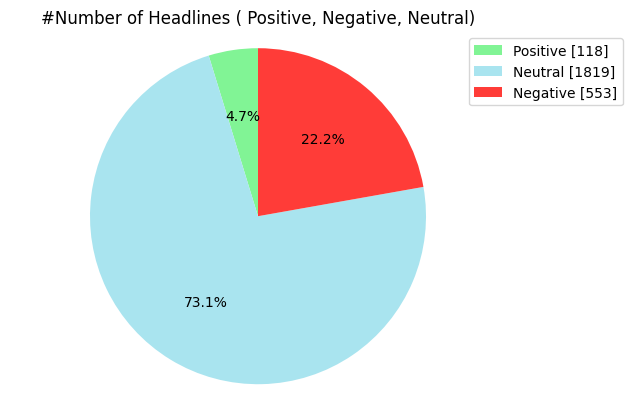

In [ ]:
scores_cnn = []

for i in range(cnn['Headline'].shape[0]):

  compound = vader_model.polarity_scores(cnn['Headline'][i])['compound']
  scores_cnn.append(compound)

sentiments_score_cnn = pd.Series(scores_cnn)
cnn['Compound'] = sentiments_score_cnn
cnn.head()

conditions = [
    (cnn['Compound'] <= -0.5),
    (cnn['Compound'] > -0.5) & (cnn['Compound'] < 0.5),
    (cnn['Compound'] > 0.5)
    ]

# creating a list of the values we want to assign for each condition
values = ['Negative', 'Neutral', 'Positive']

# creating a new column and use np.select to assign values to it using our lists as arguments
cnn['Category'] = np.select(conditions, values)

positive_cnn= len(cnn[cnn['Category'] == 'Positive'])
neutral_cnn= len(cnn[cnn['Category'] == 'Neutral'])
negative_cnn= len(cnn[cnn['Category'] == 'Negative'])

#Creating PieChart
labels = ['Positive ['+str(positive_cnn)+']' , 'Neutral ['+str(neutral_cnn)+']','Negative ['+str(negative_cnn)+']']
sizes = [positive_cnn, neutral_cnn, negative_cnn]
colors = ["#81F495","#A9E4EF","#FF3C38"]
plt.pie(sizes,colors=colors, autopct='%1.1f%%',startangle=90)
plt.style.use('default')
plt.legend(labels, bbox_to_anchor=(1.25, 1.0), loc=1)
plt.title( '#Number of Headlines ( Positive, Negative, Neutral)' )
plt.axis('equal')
plt.show()

In [ ]:
cnn = cnn[cnn['Category'].isin(['Positive','Negative'])]
mapping = {'Positive':1, 'Negative':0}
cnn['Category'] = cnn['Category'].map(mapping)
y_actual_cnn = cnn['Category'].copy()

Applying logistic regression model on CNN data

In [ ]:
y_pred_logreg= best_estimator_logistic.predict(cnn['Headline'])
print(classification_report(y_actual_cnn, y_pred_logreg))
cnn['predicted values LR'] = y_pred_logreg
cnn.drop(columns=['Compound'], axis=1, inplace=True)

              precision    recall  f1-score   support

           0       0.90      0.99      0.94       553
           1       0.93      0.47      0.62       118

    accuracy                           0.90       671
   macro avg       0.91      0.73      0.78       671
weighted avg       0.90      0.90      0.89       671



#### Word Clouds for Positive and Negative Sentiments

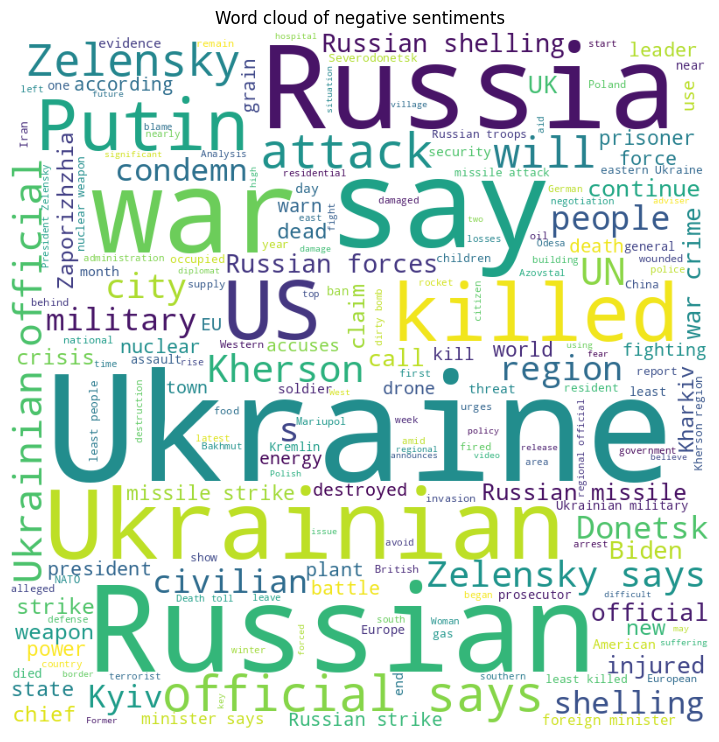

<Figure size 640x480 with 0 Axes>

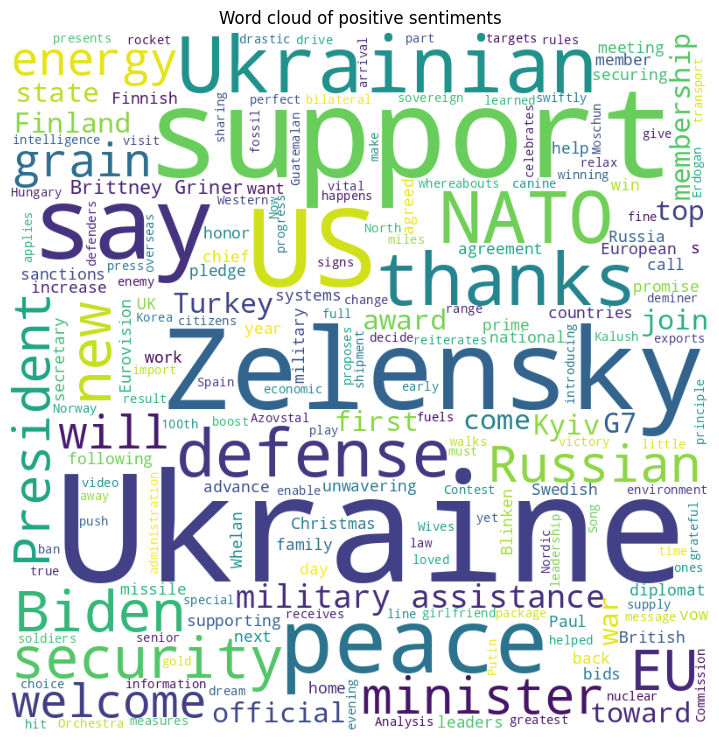

In [ ]:
# Selecting only the rows with negative sentiment
negative_data_cnn = cnn[cnn['predicted values LR'] == 0]

# Extracting the text from the 'text' column and joining into a single string
negative_text_cnn = " ".join(text for text in negative_data_cnn['Headline'])

# Generating the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', stopwords=STOPWORDS).generate(negative_text_cnn)

# Displaying the word cloud
plt.figure(figsize=(7, 7), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title('Word cloud of negative sentiments')
plt.show()

plt.subplots_adjust(wspace = 0.5)

# Selecting only the rows with positive sentiment
positive_data_cnn= cnn[cnn['predicted values LR'] == 1]

# Extracting the text from the 'text' column and joining into a single string
positive_text_cnn = " ".join(text for text in positive_data_cnn['Headline'])

# Generating the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', stopwords=STOPWORDS).generate(positive_text_cnn)

# Displaying the word cloud
plt.figure(figsize=(7, 7), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title('Word cloud of positive sentiments')
plt.show()

#### Factor and Topics Identification via Machine Learning

In [ ]:
cnn['Date'] = pd.to_datetime(cnn['Date'])
cnn.set_index('Date', inplace=True)

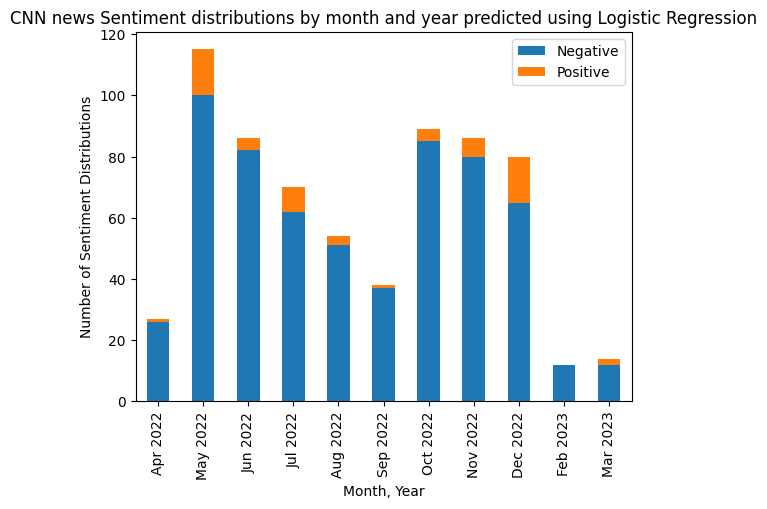

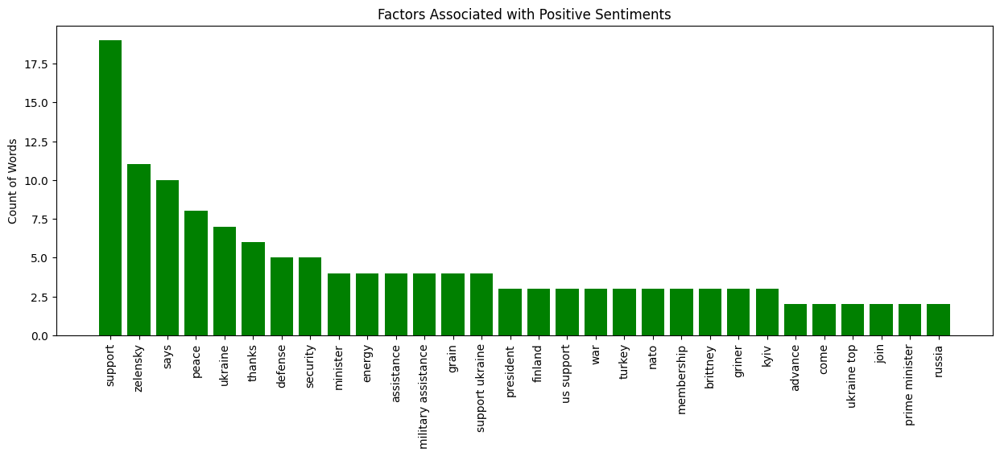

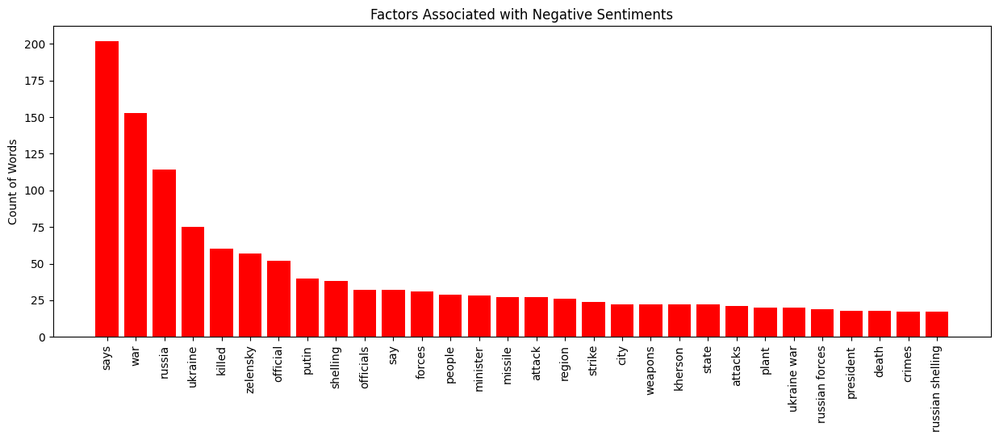

In [ ]:
################################ CNN news Sentiment distributions by month and year
from nltk.util import ngrams
#Creating new columns for sentiment labels
cnn['Negative'] = (cnn['predicted values LR'] == 0).astype(int)
cnn['Positive'] = (cnn['predicted values LR'] == 1).astype(int)

#Grouping by month and year and aggregating sum of sentiment columns
monthly_sentiment = cnn.groupby([cnn.index.year, cnn.index.month]).agg({'Negative': 'sum', 'Positive': 'sum'})

# Plotting stacked bar graph
monthly_sentiment.plot(kind='bar', stacked=True)

# Modifying x-axis to display month and year labels
labels = [datetime.datetime(year=x[0], month=x[1], day=1) for x in monthly_sentiment.index]
labels = [x.strftime('%b %Y') for x in labels]
plt.xticks(range(len(labels)), labels)

plt.xlabel('Month, Year')
plt.ylabel('Number of Sentiment Distributions')
plt.title('CNN news Sentiment distributions by month and year predicted using Logistic Regression')
plt.show()


########################################## Bi-grams

def extract_factors(text):
  tokens = word_tokenize(text.lower())
  stop_words = set(stopwords.words('english'))
  filtered_tokens = [token for token in tokens if token not in stop_words and token.isalpha()]

  # Extracting both single and double word factors
  single_factors = []
  double_factors = []
  for token, pos in nltk.pos_tag(filtered_tokens):
    if pos.startswith('NN') or pos.startswith('VB'):
      single_factors.append(token)
  for factor in ngrams(filtered_tokens, 2):
    if factor[0] in single_factors and factor[1] in single_factors:
      # Skipping double word factors if they consist of two single word factors
      continue
    double_factors.append(' '.join(factor))
  return single_factors + double_factors

# Creating a list of factors and their associated sentiments
factors_sentiments = []
for index, row in cnn.iterrows():
  factors = extract_factors(row['Headline'])
  for factor in factors:
    factors_sentiments.append((factor, row['predicted values LR']))

# Creating a bar chart of factors associated with positive sentiments
positive_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 1]
positive_counts = Counter(positive_factors).most_common(30)
positive_factors = [x[0] for x in positive_counts]
positive_counts = [x[1] for x in positive_counts]
fig, ax = plt.subplots(figsize=(15, 5))
ax.bar(range(len(positive_counts)), positive_counts, align='center', color='green')
ax.set_xticks(range(len(positive_factors)))
ax.set_xticklabels(positive_factors, rotation='vertical')
ax.set_title('Factors Associated with Positive Sentiments')
ax.set_ylabel(label)
plt.show()

# Creating a bar chart of factors associated with negative sentiments
negative_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 0]
negative_counts = Counter(negative_factors).most_common(30)
negative_factors = [x[0] for x in negative_counts]
negative_counts = [x[1] for x in negative_counts]
fig, ax = plt.subplots(figsize=(15, 5))
ax.bar(range(len(negative_counts)), negative_counts, align='center', color='red')
ax.set_xticks(range(len(negative_factors)))
ax.set_xticklabels(negative_factors, rotation='vertical')
ax.set_title('Factors Associated with Negative Sentiments')
ax.set_ylabel(label)
plt.show()

From the above bigrams, we can see that some of the words like support, thanks, peace, military assistance, support Ukraine, US support, Ukraine top and Zelensky thanks are major contributors towards the positive sentiment.</br></br> Similarly, we can see that some of the words like war, attack, missile, forces, strike, weapons, Ukraine war, Russian forces, crimes, death and Russian shelling are major contributors towards the negative sentiment.

For CNN News Dataset, which consisted of news headlines, our sentiment classification model achieved an accuracy of 90%. This indicates that the model was able to correctly classify the sentiment of most of the headlines. The model classified 4.7% of the reviews as positive, 73.1% as neutral, and 22.2% as negative. The classification results are as expected as News channels typically strive to present information in an unbiased and neutral manner. However, we can see that the negative sentiments predominated over the positive sentiments as the things that unfolded due to the war had more negative consequences rather than positive.

#### Visualizations, Storytelling, Recommendations

In [ ]:
########################## BERT
umap_model = UMAP(random_state=1122)
bert_topic_model= BERTopic(embedding_model = "all-MiniLM-L6-v2", umap_model=umap_model)

stop_words = set(stopwords.words('english'))
cnn['Headline'] = cnn['Headline'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words]))

bert_negative_cnn = cnn[cnn['predicted values LR']==0]
bert_negative_cnn = bert_negative_cnn.Headline.tolist()
topics, probs = bert_topic_model.fit_transform(bert_negative_cnn)

bert_topic_model.visualize_barchart()

Summary:<br>
There is a global food crisis due to the ongoing war. Kherson is under severe attack from Russian forces and Zelensky asks for support and aid from western countries.

Topic 1:
ukraine, zelensky, ukrainian, peace, defense, russian, support, security, thanks, military
Topic 2:
ukraine, support, putin, says, diplomat, country, signs, invasion, ukrainian, zelensky
Topic 3:
ukraine, biden, says, peace, nato, membership, energy, bids, finnish, swedish
Topic 4:
says, ukraine, russian, official, security, zelensky, uk, russia, agree, new
Topic 5:
ukraine, says, support, russia, ukrainian, peace, eu, russian, house, increase


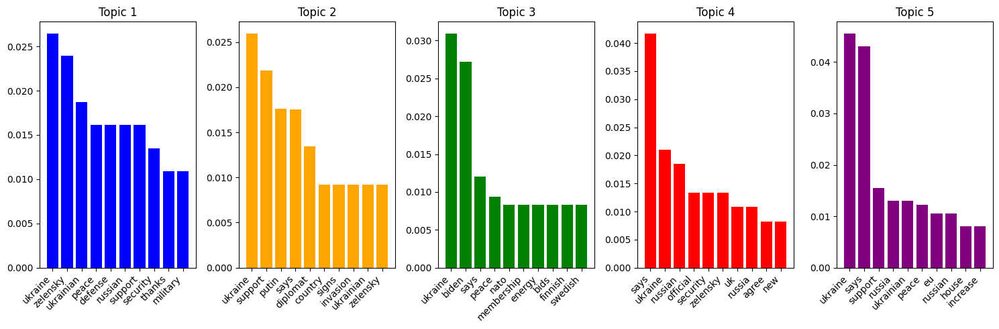

In [ ]:
################################## LDA

lda_positive_cnn = cnn[cnn['Category']==1]

vectorizer = CountVectorizer(stop_words='english')
positive_topics_cnn = vectorizer.fit_transform(lda_positive_cnn['Headline'])

# Applying LDA to the document-term matrix
n_topics = 5
lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
lda.fit(positive_topics_cnn)

# Getting the most representative words or phrases for each topic
feature_names_cnn = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(lda.components_):
    top_words = [feature_names_cnn[i] for i in topic.argsort()[:-10 - 1:-1]]
    print("Topic %d:" % (topic_idx + 1))
    print(", ".join(top_words))

# Setting the number of words to display for each topic
n_words = 10

# Getting the importance of each word in each topic
word_importance_cnn = lda.components_ / lda.components_.sum(axis=1)[:, np.newaxis]

# Defining the colors for each topic
colors = ['blue', 'orange', 'green', 'red', 'purple']

# Creating a 1x5 grid of subplots
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(15, 5))

# Flattening the array of subplots so we can iterate over them
axes = axes.flatten()

# Plotting the bar graph for each topic
for i in range(n_topics):
    ax = axes[i]
    ax.bar(np.arange(n_words), word_importance_cnn[i][np.argsort(word_importance_cnn[i])[:-n_words-1:-1]], color=colors[i])
    ax.set_xticks(np.arange(n_words))
    ax.set_xticklabels(np.array(feature_names_cnn)[np.argsort(word_importance_cnn[i])[:-n_words-1:-1]], rotation=45, ha='right')
    ax.set_title("Topic {}".format(i+1))

# Hiding any unused subplots
for i in range(n_topics, len(axes)):
    axes[i].axis('off')

# Adjusting spacing between subplots
fig.tight_layout()

plt.show()

### 3b. News<br>
Dataset 2 - Fox news

In [ ]:
#!pip install snscrape
#import snscrape.modules.twitter as sntwitter
'''query = '(Ukraine OR Russia OR war) (from:FoxNews) until:2023-03-25 since:2022-02-15'
limit = 5000
tweets = []
for tweet in sntwitter.TwitterSearchScraper(query).get_items():
  if len(tweets) == limit:
    break
  else:
    tweets.append([tweet.date, tweet.content])
fox_df = pd.DataFrame(tweets, columns = ['date', 'headlines'])'''
#fox_df['date'] = fox_df['date'].apply(lambda x: x.strftime('%Y-%m-%d'))
#fox_df.to_csv('fox_data.csv', index=False)

fox_df= pd.read_csv('/content/fox_data.csv')
fox_df['headlines'] = clean_tweets(fox_df['headlines'])
fox_df['headlines'].head()

0    un denounces alleged torture, human shields, o...
1    russias medvedev claims moscow may send troops...
2    biden admin cracks down on air conditioners as...
3    desantis says ukraine comments were mischaract...
4    greg gutfeld: san franciscos proposed reparati...
Name: headlines, dtype: object

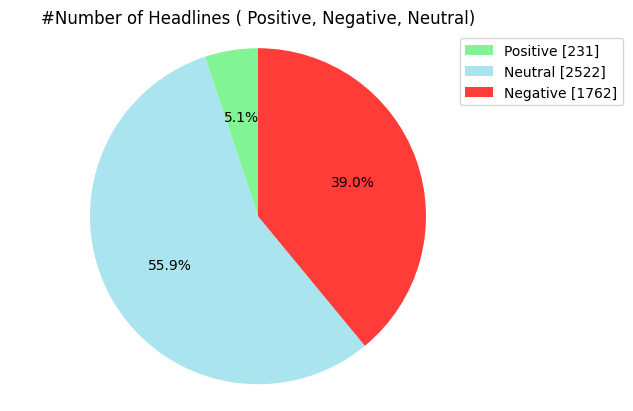

In [ ]:
vader_model = SentimentIntensityAnalyzer()
scores_fox = []

for i in range(fox_df['headlines'].shape[0]):
  compound = vader_model.polarity_scores(fox_df['headlines'][i])["compound"]
  scores_fox.append(compound)

sentiments_score_fox = pd.Series(scores_fox)
fox_df['Compound'] = sentiments_score_fox

conditions = [
    (fox_df['Compound'] <= -0.5),
    (fox_df['Compound'] > -0.5) & (fox_df['Compound'] < 0.5),
    (fox_df['Compound'] > 0.5)
    ]

# creating a list of the values we want to assign for each condition
values = ['Negative', 'Neutral', 'Positive']

# creating a new column and use np.select to assign values to it using our lists as arguments
fox_df['Category'] = np.select(conditions, values)

positive_fox= len(fox_df[fox_df['Category'] == 'Positive'])
neutral_fox= len(fox_df[fox_df['Category'] == 'Neutral'])
negative_fox= len(fox_df[fox_df['Category'] == 'Negative'])

#Creating PieChart
labels = ['Positive ['+str(positive_fox)+']' , 'Neutral ['+str(neutral_fox)+']','Negative ['+str(negative_fox)+']']
sizes = [positive_fox, neutral_fox, negative_fox]
colors = ["#81F495","#A9E4EF","#FF3C38"]
plt.pie(sizes,colors=colors, autopct='%1.1f%%',startangle=90)
plt.style.use('default')
plt.legend(labels, bbox_to_anchor=(1.25, 1.0), loc=1)
plt.title( '#Number of Headlines ( Positive, Negative, Neutral)' )
plt.axis('equal')
plt.show()

In [ ]:
fox_df = fox_df[fox_df['Category'].isin(['Positive','Negative'])]
mapping = {'Positive':1, 'Negative':0}
fox_df['Category'] = fox_df['Category'].map(mapping)
y_actual_fox = fox_df['Category']

Applying logistic regression model on fox dataset

In [ ]:
y_pred_logreg_fox = best_estimator_logistic.predict(fox_df['headlines'])
print(classification_report(y_actual_fox, y_pred_logreg_fox))
fox_df['predicted_values_logreg'] = y_pred_logreg_fox
fox_df.drop(columns=['Compound'], axis=1, inplace=True)

              precision    recall  f1-score   support

           0       0.92      0.99      0.95      1762
           1       0.88      0.31      0.46       231

    accuracy                           0.92      1993
   macro avg       0.90      0.65      0.71      1993
weighted avg       0.91      0.92      0.90      1993



#### Word Clouds for Positive and Negative Sentiments

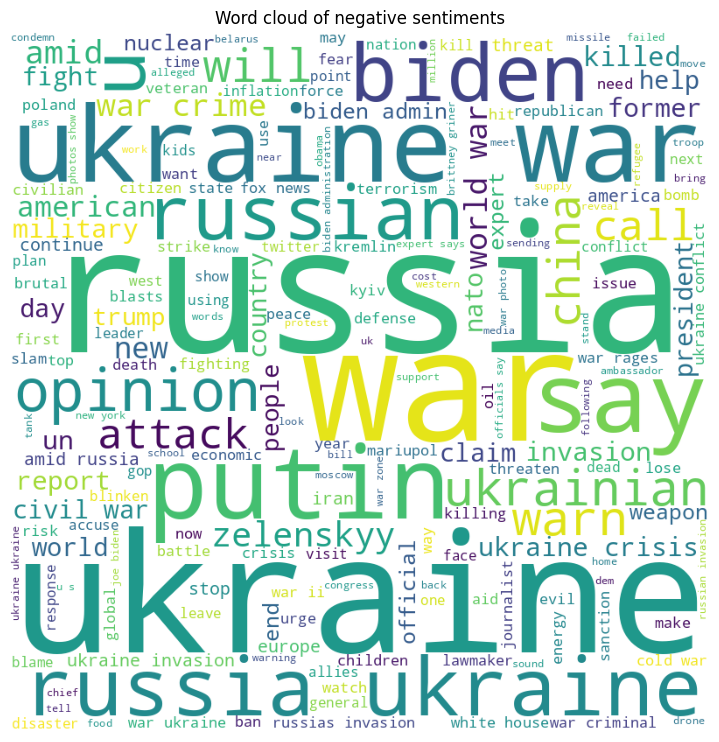

<Figure size 640x480 with 0 Axes>

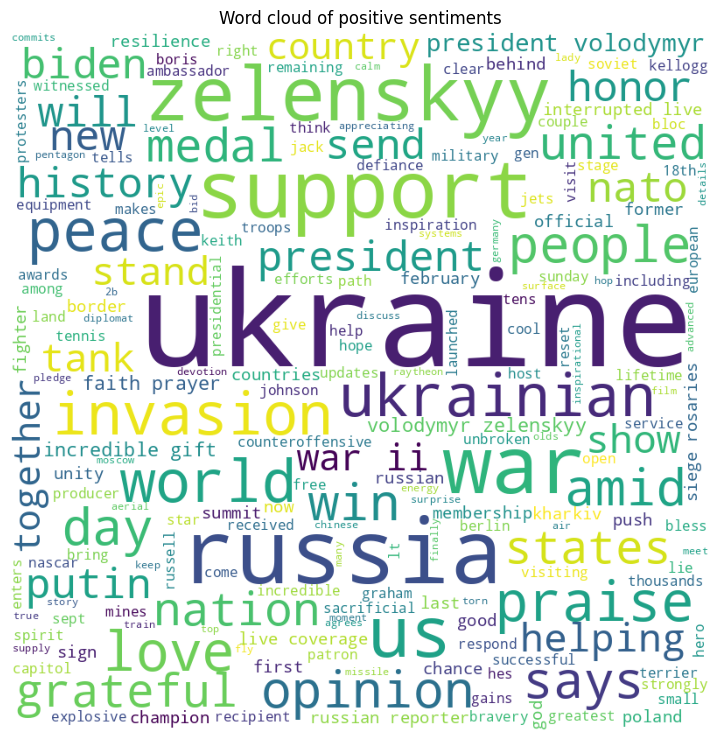

In [ ]:
# Selecting only the rows with negative sentiment
negative_data_fox = fox_df[fox_df['predicted_values_logreg'] == 0]

# Extracting the text from the 'text' column and joining into a single string
negative_text_fox = " ".join(text for text in negative_data_fox['headlines'])

# Generating the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', stopwords=STOPWORDS).generate(negative_text_fox)

# Displaying the word cloud
plt.figure(figsize=(7, 7), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title('Word cloud of negative sentiments')
plt.show()

plt.subplots_adjust(wspace = 0.5)

positive_data_fox= fox_df[fox_df['predicted_values_logreg'] == 1]

# Extracting the text from the 'text' column and joining into a single string
positive_text_fox = " ".join(text for text in positive_data_fox['headlines'])

# Generating the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', stopwords=STOPWORDS).generate(positive_text_fox)

# Displaying the word cloud
plt.figure(figsize=(7, 7), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title('Word cloud of positive sentiments')
plt.show()

#### Factor and Topics Identification via Machine Learning

In [ ]:
fox_df['date'] = pd.to_datetime(fox_df['date'])
fox_df.set_index('date', inplace=True)

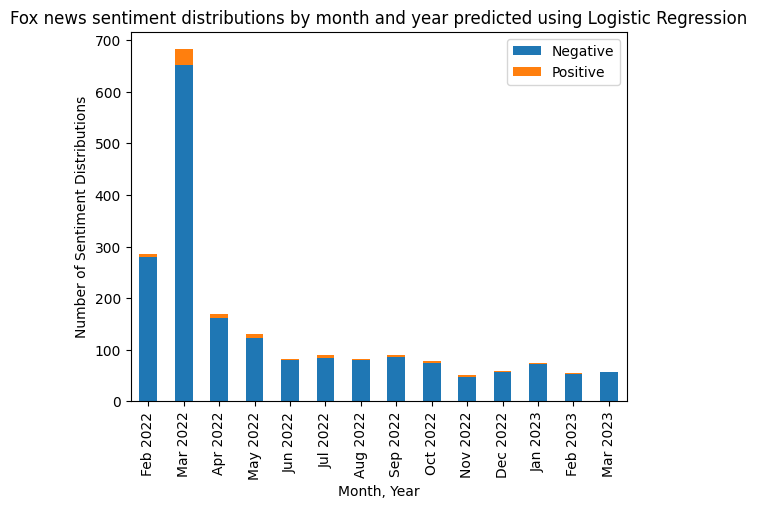

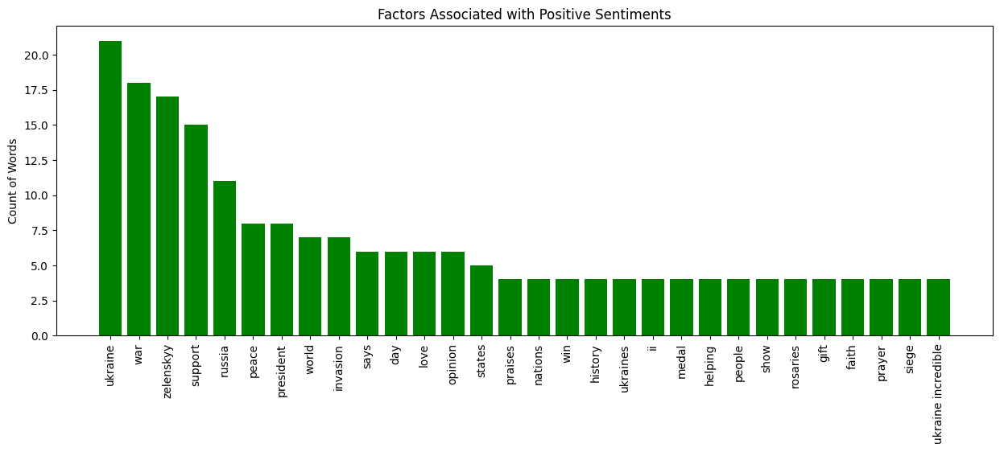

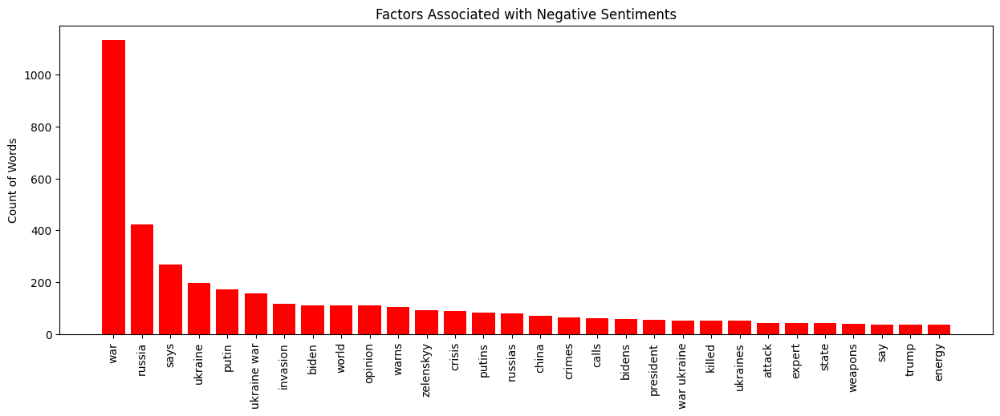

In [ ]:
################################# Fox news sentiment distributions by month and year

#Creating new columns for sentiment labels
fox_df['Negative'] = (fox_df['predicted_values_logreg'] == 0).astype(int)
fox_df['Positive'] = (fox_df['predicted_values_logreg'] == 1).astype(int)

#Grouping by month and year and aggregate sum of sentiment columns
monthly_sentiment = fox_df.groupby([fox_df.index.year, fox_df.index.month]).agg({'Negative': 'sum', 'Positive': 'sum'})

#Plotting stacked bar graph
monthly_sentiment.plot(kind='bar', stacked=True)

#Modifying x-axis to display month and year labels
labels = [datetime.datetime(year=x[0], month=x[1], day=1) for x in monthly_sentiment.index]
labels = [x.strftime('%b %Y') for x in labels]
plt.xticks(range(len(labels)), labels)

plt.xlabel('Month, Year')
plt.ylabel('Number of Sentiment Distributions')
plt.title('Fox news sentiment distributions by month and year predicted using Logistic Regression')
plt.show()

#################################### Bigrams

def extract_factors(text):
  tokens = word_tokenize(text.lower())
  stop_words = set(stopwords.words('english'))
  filtered_tokens = [token for token in tokens if token not in stop_words and token.isalpha()]

  # Extracting both single and double word factors
  single_factors = []
  double_factors = []
  for token, pos in nltk.pos_tag(filtered_tokens):
    if pos.startswith('NN') or pos.startswith('VB'):
      single_factors.append(token)
  for factor in ngrams(filtered_tokens, 2):
    if factor[0] in single_factors and factor[1] in single_factors:
      # Skipping double word factors if they consist of two single word factors
      continue
    double_factors.append(' '.join(factor))
  return single_factors + double_factors

# Creating a list of factors and their associated sentiments
factors_sentiments = []
for index, row in fox_df.iterrows():
  factors = extract_factors(row['headlines'])
  for factor in factors:
    factors_sentiments.append((factor, row['predicted_values_logreg']))

# Creating a bar chart of factors associated with positive sentiments
positive_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 1]
positive_counts = Counter(positive_factors).most_common(30)
positive_factors = [x[0] for x in positive_counts]
positive_counts = [x[1] for x in positive_counts]
fig, ax = plt.subplots(figsize=(15, 5))
ax.bar(range(len(positive_counts)), positive_counts, align='center', color='green')
ax.set_xticks(range(len(positive_factors)))
ax.set_xticklabels(positive_factors, rotation='vertical')
ax.set_title('Factors Associated with Positive Sentiments')
ax.set_ylabel(label)
plt.show()

# Creating a bar chart of factors associated with negative sentiments
negative_factors = [factor for factor, sentiment in factors_sentiments if sentiment == 0]
negative_counts = Counter(negative_factors).most_common(30)
negative_factors = [x[0] for x in negative_counts]
negative_counts = [x[1] for x in negative_counts]
fig, ax = plt.subplots(figsize=(15, 5))
ax.bar(range(len(negative_counts)), negative_counts, align='center', color='red')
ax.set_xticks(range(len(negative_factors)))
ax.set_xticklabels(negative_factors, rotation='vertical')
ax.set_title('Factors Associated with Negative Sentiments')
ax.set_ylabel(label)
plt.show()

From the above bigrams, we can see that some of the words like support, praises, peace, love, faith, prayer, Ukraine incredible and incredible gift are major contributors towards the positive sentiment.</br></br> Similarly, we can see that some of the words like Ukraine war, attack, crisis, invasion, crimes, weapons and war Ukraine are major contributors towards the negative sentiment.

For Fox News Dataset, which consisted of news headlines, our sentiment classification model achieved an accuracy of 92%. This indicates that the model was able to correctly classify the sentiment of most of the headlines. The model classified 5.1% of the reviews as positive, 55.9% as neutral, and 39% as negative. The classification results of Neutral sentiments higher than the others are as expected as News channels typically strive to present information in an unbiased and neutral manner. However, we can see that the negative sentiments is about 8 folds when compared to the positive sentiments as the things that unfolded due to the war had more negative consequences rather than positive thus creating a lot of negative headlines over the positive ones.

#### Visualizations, Storytelling, Recommendations

In [ ]:
################################# BERT

umap_model = UMAP(random_state=1122)
bert_topic_model= BERTopic(embedding_model = "all-MiniLM-L6-v2", umap_model=umap_model)

stop_words = set(stopwords.words('english'))
fox_df['headlines'] = fox_df['headlines'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words]))

bert_negative_fox = fox_df[fox_df['predicted_values_logreg']==0]
bert_negative_fox = bert_negative_fox.headlines.tolist()
topics, probs = bert_topic_model.fit_transform(bert_negative_fox)

bert_topic_model.visualize_barchart()

Summary:<br>
Putin continues to assault Ukraine. Social media is flooded with messages and Russia faces sanctions and charges worldwide.

Topic 1:
ukraine, russia, zelenskyy, putin, opinion, says, russias, peace, xi, ukraines
Topic 2:
ukraine, russia, peace, zelenskyy, win, help, talks, president, world, fight
Topic 3:
ukraine, russia, says, ukraines, invasion, support, strong, amid, freedom, russian
Topic 4:
ukraine, russia, biden, peace, incredible, faith, bring, war, app, gift
Topic 5:
russia, ukraine, war, says, help, zelenskyy, biden, ukrainian, love, new


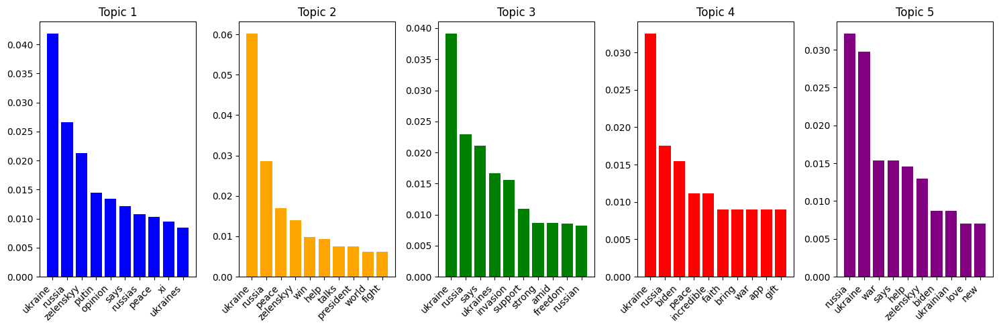

In [ ]:
############################### LDA

lda_positive_fox = fox_df[fox_df['Category']==1]

vectorizer = CountVectorizer(stop_words='english')
positive_topics_fox = vectorizer.fit_transform(lda_positive_fox['headlines'])

# Applying LDA to the document-term matrix
n_topics = 5
lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
lda.fit(positive_topics_fox)

# Getting the most representative words or phrases for each topic
feature_names_fox = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(lda.components_):
    top_words = [feature_names_fox[i] for i in topic.argsort()[:-10 - 1:-1]]
    print("Topic %d:" % (topic_idx + 1))
    print(", ".join(top_words))

# Setting the number of words to display for each topic
n_words = 10

# Getting the importance of each word in each topic
word_importance_fox = lda.components_ / lda.components_.sum(axis=1)[:, np.newaxis]

# Defining the colors for each topic
colors = ['blue', 'orange', 'green', 'red', 'purple']

# Create a 1x5 grid of subplots
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(15, 5))

# Flattening the array of subplots so we can iterate over them
axes = axes.flatten()

# Plotting the bar graph for each topic
for i in range(n_topics):
    ax = axes[i]
    ax.bar(np.arange(n_words), word_importance_fox[i][np.argsort(word_importance_fox[i])[:-n_words-1:-1]], color=colors[i])
    ax.set_xticks(np.arange(n_words))
    ax.set_xticklabels(np.array(feature_names_fox)[np.argsort(word_importance_fox[i])[:-n_words-1:-1]], rotation=45, ha='right')
    ax.set_title("Topic {}".format(i+1))

# Hiding any unused subplots
for i in range(n_topics, len(axes)):
    axes[i].axis('off')

# Adjusting spacing between subplots
fig.tight_layout()

plt.show()

## Recommendations

**1. HEROES AND INDIVIDUAL NARRATIVE**

<ol type="a">
<li>Evoke strong emotional responses</li>
<li> Make an issue more vivid and concrete in people’s mind</li>
<li>People can see the direct impact of their action</li>
<li>Identifiable victims are more relatable to the public</li>
<li>Prevent overwhelming data and compassion fatigue</li>
</ol>

**2. THE UPLIFTING HUMANITARIAN EFFORTS**
<ol type="a">
<li>Appeal to the general public’s compassion</li>
<li> Show effect of aid to critical areas that are getting negative sentiments</li>
<li>Prioritize transparency and communication on frequently negative issues</li>
<li>Highlight life saving narratives</li>
</ol>

**3. COUNTERACTING THE NEGATIVE**
<ol type="a">
<li>Identify the most vulnerable audience</li>
<li> Highlight the impact of foreign aid on Ukrainian lives</li>
<li>Be transparent about aid allocation</li>
<li>Report the progress of reconstruction activities</li>
</ol>

Note: A detailed explanation on recommendations are published in the report.